# Active Learning 
## IMD3011 - Datacentric AI
### [Dr. Elias Jacob de Menezes Neto](https://docente.ufrn.br/elias.jacob)


## Keypoints

- **Data Labeling is Expensive and Time-Consuming:** Obtaining labeled data for machine learning models is a significant bottleneck due to financial and time costs.

- **Active Learning Reduces Labeling Effort:**  Active learning aims to minimize the amount of labeled data needed to achieve good model performance by strategically selecting the most informative samples to label.

- **Initial Labeling Strategies Matter:** Starting with a well-chosen initial labeled dataset, like using cluster centers and random sampling, is crucial for effective active learning.

- **Uncertainty Sampling Focuses on Model Uncertainty:** This strategy selects data points where the model is least confident in its predictions, using measures like least confidence, margin of confidence, ratio of confidence, and entropy.

- **Query by Committee (QBC) Leverages Model Disagreement:** QBC uses a committee of models and selects data points where the committee members disagree the most, indicating areas of uncertainty. Disagreement is measured by vote entropy and KL divergence.

- **Diversity Sampling Ensures Data Representativeness:** This strategy selects data points to maximize the diversity of the labeled dataset, covering a broad range of data patterns. Methods include cluster-based sampling and central-set selection.

- **Combining Active Learning Techniques can be Powerful:** Integrating different strategies, like uncertainty and diversity sampling, can lead to more sturdy and efficient active learning approaches.

- **ActiveLab Addresses Noisy Labels:** ActiveLab combines active learning with confident learning to handle situations where labels might be imperfect, dynamically choosing between labeling new data and re-labeling potentially mislabeled data.


## Learning goals
By the end of this class, you will be able to:

1. **Explain** the fundamental principles and motivations behind active learning, contrasting it with traditional passive learning approaches in scenarios with limited labeled data.

2. **Analyze** the financial and temporal costs associated with data labeling in machine learning projects and justify the value proposition of active learning in reducing these costs.

3. **Compare and contrast** different uncertainty sampling strategies, such as least confidence, margin of confidence, ratio of confidence, and entropy sampling, and apply them to select informative data points for labeling.

4. **Execute** and evaluate Query by Committee (QBC) active learning strategies, utilizing measures like vote entropy and Kullback-Leibler (KL) divergence to quantify model disagreement and guide data selection.

5. **Apply** diversity sampling techniques, including cluster-based sampling and fundamental-set selection, to ensure the selection of a representative and diverse labeled dataset from an unlabeled pool.

6. **Design** and apply hybrid active learning strategies by combining uncertainty sampling, Query by Committee, and diversity sampling to perfect data selection and model performance.

7. **Critically evaluate** the performance of various active learning strategies using appropriate metrics and experimental setups, comparing their effectiveness in different data scenarios.

8. **Analyze** the challenges of noisy labels in real-world datasets and **apply** the ActiveLab framework to mitigate the impact of label noise within an active learning loop.

9. **Utilize** Python libraries such as scikit-learn, umap, and plotly to apply, visualize, and analyze the results of active learning experiments.

10. **Apply** active learning principles to real-world Datacentric AI problems, demonstrating an understanding of how to strategically acquire and utilize labeled data to improve model accuracy and efficiency.


In [1]:
import os

os.environ["TOKENIZERS_PARALLELISM"] = "false"
import pandas as pd

In [2]:
pd.set_option("display.max_columns", 200)
pd.set_option("display.max_rows", 200)

## Our Dataset

We'll be using a subset of the [food101](https://huggingface.co/datasets/ethz/food101) dataset. The original dataset contains 100,000 labels and 101 classes of food images. For this demonstration, we'll focus on a subset of 10 classes to illustrate the active learning process. The goal is to train a model to classify these food images accurately while minimizing the number of labeled examples required.

I'll assume you have the budget to label 300 images. We'll explore how active learning techniques can help you select the most informative samples to label, improving model performance with limited labeled data.

In [3]:
from datasets import load_from_disk  # Import the function to load datasets from disk
import helpers.dataset  # Import custom helper functions for dataset manipulation

# Load the dataset from the specified directory
# 'data/food101_subset' is the path to the dataset directory
# The dataset is expected to be in a format compatible with the 'datasets' library
ds = load_from_disk("data/food101_subset")

# Display the loaded dataset
# This will show the structure and contents of the dataset
ds

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 7500
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 2500
    })
})

In [4]:
# Extract unique labels from the training dataset
labels_str = list(set(ds["train"]["label"]))

# Sort the labels in alphabetical order
labels_str.sort()

# Display the sorted list of unique labels
labels_str

['apple_pie',
 'cannoli',
 'chicken_curry',
 'gyoza',
 'hot_dog',
 'pizza',
 'pork_chop',
 'risotto',
 'sushi',
 'tiramisu']

In [5]:
# Create a dictionary to map string labels to integer indices
# 'enumerate(labels_str)' generates pairs of (index, label) for each label in 'labels_str'
# The dictionary comprehension creates a mapping from each label to its corresponding index
str_to_int = {label: i for i, label in enumerate(labels_str)}

# Create a dictionary to map integer indices back to string labels
# This is the inverse mapping of 'str_to_int'
# The dictionary comprehension creates a mapping from each index to its corresponding label
int_to_str = {i: label for i, label in enumerate(labels_str)}

# Display the dictionary mapping string labels to integer indices
str_to_int

{'apple_pie': 0,
 'cannoli': 1,
 'chicken_curry': 2,
 'gyoza': 3,
 'hot_dog': 4,
 'pizza': 5,
 'pork_chop': 6,
 'risotto': 7,
 'sushi': 8,
 'tiramisu': 9}

In [6]:
import matplotlib.pyplot as plt  # Import the matplotlib library for plotting
import numpy as np  # Import the numpy library for numerical operations


def view_image(image, label):
    """
    Displays an image with a given label using matplotlib.

    Args:
        image: The image data to be displayed. Expected to be in a format compatible with numpy arrays.
        label (str): The label or title to be displayed above the image.
    """
    plt.figure()  # Create a new figure for the plot
    plt.title(label)  # Set the title of the plot to the provided label
    plt.imshow(np.array(image))  # Display the image data as an array
    plt.axis("off")  # Turn off the axis labels and ticks for a cleaner look
    plt.show()  # Display the plot

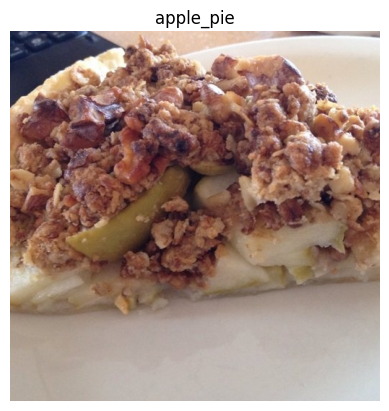

In [7]:
view_image(ds["train"][0]["image"], ds["train"][0]["label"])

In [8]:
from PIL import Image
from torch import embedding
from transformers import AutoImageProcessor, AutoModel
from tqdm import tqdm
import numpy as np
import joblib
from pathlib import Path

# Create the output directory if it doesn't exist
Path("outputs/food101").mkdir(parents=True, exist_ok=True)


def extract_features(
    ds: list[dict], processor: AutoImageProcessor, model: AutoModel
) -> tuple[np.ndarray, np.ndarray]:
    """
    Extracts features and labels from a dataset using a pre-trained model.

    Args:
        ds (list[dict]): The dataset containing image data and labels.
        processor (AutoImageProcessor): The image processor for preprocessing images.
        model (AutoModel): The pre-trained model for feature extraction.

    Returns:
        tuple[np.ndarray, np.ndarray]: Arrays of extracted features and corresponding labels.
    """
    # Initialize two empty lists to store the features and labels
    features = []
    labels = []

    # Iterate over the dataset
    for example in tqdm(ds):
        # Extract the image from the example and convert it to a PIL Image
        image = Image.fromarray(np.array(example["image"]))

        # Preprocess the image using the processor
        inputs = processor(images=image, return_tensors="pt")

        # Extract features from the pre-trained model
        outputs = model(**inputs)

        # Store the features and labels
        features.append(
            outputs.last_hidden_state.mean(dim=1).squeeze().detach().numpy()
        )
        labels.append(str_to_int[example["label"]])

    # Convert the lists to numpy arrays
    features = np.array(features)
    labels = np.array(labels)

    return features, labels


# Check if the feature files already exist
if (
    not Path("outputs/food101/train_data.joblib").exists()
    or not Path("outputs/food101/valid_data.joblib").exists()
):
    # Load the pre-trained model and processor from Hugging Face
    processor = AutoImageProcessor.from_pretrained("google/vit-base-patch16-224-in21k")
    model = AutoModel.from_pretrained("google/vit-base-patch16-224-in21k")

    # Extract features from training and validation datasets
    train_features, train_labels = extract_features(ds["train"], processor, model)
    valid_features, valid_labels = extract_features(ds["validation"], processor, model)

    # Create a list of ImageItem objects for the training dataset
    train_images = []
    for i in range(len(ds["train"])):
        train_images.append(
            helpers.dataset.ImageItem(
                image_data=ds["train"][i]["image"],
                label_index=train_labels[i],
                label_name=int_to_str[train_labels[i]],
                embedding=train_features[i],
            )
        )

    # Create a list of ImageItem objects for the validation dataset
    valid_images = []
    for i in range(len(ds["validation"])):
        valid_images.append(
            helpers.dataset.ImageItem(
                image_data=ds["validation"][i]["image"],
                label_index=valid_labels[i],
                label_name=int_to_str[valid_labels[i]],
                embedding=valid_features[i],
            )
        )

    # Create SimpleImageDataset objects for training and validation datasets
    train_dataset = helpers.dataset.SimpleImageDataset(
        image_items=train_images, split="train"
    )

    valid_dataset = helpers.dataset.SimpleImageDataset(
        image_items=valid_images, split="valid"
    )

    # Save the datasets to disk
    train_dataset.save("outputs/food101/train_data.joblib")
    valid_dataset.save("outputs/food101/valid_data.joblib")

else:
    # Load the datasets from disk if they already exist
    train_dataset = helpers.dataset.SimpleImageDataset.load(
        "outputs/food101/train_data.joblib"
    )
    valid_dataset = helpers.dataset.SimpleImageDataset.load(
        "outputs/food101/valid_data.joblib"
    )

In [9]:
# Display the loaded datasets
train_dataset, valid_dataset

(ImageDataset with 7500 images in the train split,
 ImageDataset with 2500 images in the valid split)

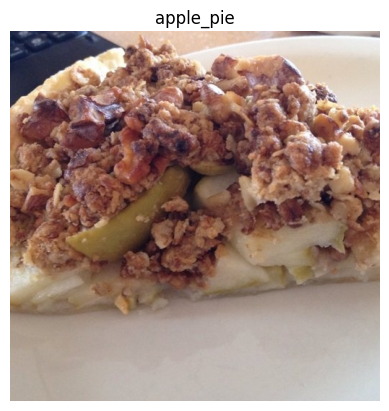

ImageItem(label_name=apple_pie)

In [10]:
train_dataset[0]

In [11]:
import umap
import numpy as np
import plotly.express as px
import pandas as pd

# Create a UMAP projection of the valid features
# UMAP (Uniform Manifold Approximation and Projection) is a dimensionality reduction technique
# that is particularly well-suited for visualizing high-dimensional data.

# Assuming valid_features is a list of tuples where each tuple contains (label, file_path, feature_vector)
# Extract the feature vectors from valid_features and convert them to a numpy array
feature_vectors = np.array([image.embedding for image in valid_dataset.image_items])

# Initialize the UMAP model with desired parameters
# n_neighbors: The size of the local neighborhood (in terms of number of neighboring sample points) used for manifold approximation
# min_dist: The minimum distance between points in the low-dimensional space
# n_components: The number of dimensions of the low-dimensional space (2D in this case)
# random_state: Seed for the random number generator to ensure reproducibility
umap_model = umap.UMAP(
    n_neighbors=15, min_dist=0.1, n_components=2, random_state=271828
)

# Fit the UMAP model to the feature vectors and transform them into a 2D projection
valid_features_umap = umap_model.fit_transform(feature_vectors)

# Create a DataFrame from the UMAP projection
# The DataFrame will have columns "x" and "y" for the 2D coordinates
df = pd.DataFrame(valid_features_umap, columns=["x", "y"])

# Add a column for the labels to the DataFrame
df["label"] = [image.label_name for image in valid_dataset.image_items]

# Plot the UMAP projection with uniform opacity
# Use Plotly Express to create a scatter plot of the UMAP projection
# Color the points by their labels ("Cat" or "Dog")
fig = px.scatter(
    df,
    x="x",
    y="y",
    color="label",
    title="UMAP Projection of Valid Features",
    opacity=0.7,
)

# Show the plot
fig.show()

/home/jacob/.cache/pypoetry/virtualenvs/imd3011-datacentric-ai-ZY2qswVr-py3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/jacob/.cache/pypoetry/virtualenvs/imd3011-datacentric-ai-ZY2qswVr-py3.12/lib/python3.12/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


In [12]:
# We'll need to create an Oracle for Active Learning. This Oracle will "replace" the human annotator in the Active Learning loop. The Oracle will be a simple function that will return the label of an image given its index in the dataset. We'll use this Oracle to simulate the human annotator in the Active Learning loop.


def oracle_fn(image):
    """
    This function serves as an oracle function for an image classification task.

    Args:
        image (ImageItem): An instance of the ImageItem class, which contains metadata and embedding of the image.

    Returns:
        int: The integer label of the image.

    Explanation:
    - The function takes an ImageItem object as input.
    - It returns the integer label associated with the image, which is stored in the 'label_index' attribute of the ImageItem.
    - This function can be used to retrieve the ground truth label of an image for tasks such as evaluation or training.
    """
    return image.label_index


# Let's test the oracle function on an image from the validation dataset.

oracle_fn(valid_dataset[0])

6

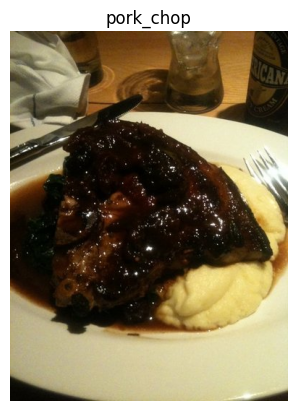

ImageItem(label_name=pork_chop)

In [13]:
valid_dataset[0]

# Active Learning

## The Challenge of Data Labeling

### Understanding Data Labeling Costs

Data labeling is a necessary step in training machine learning models, yet it incurs both financial and temporal costs. This section provides a detailed understanding of these costs:

- **Financial Costs:**
  - **Human Annotation Costs:** Hiring experts or annotators to label large datasets can be expensive. Organizations, such as Amazon or Google, invest significantly in data labeling to secure high-quality annotations.
  - **Operational Costs:** Managing the labeling workflow and ensuring quality control generate additional expenses.

- **Temporal Costs:**
  - **Time-Intensive Process:** Labeling may take weeks or months to complete, especially in domains that demand subject matter expertise.
  - **Complex Data Domains:** Consider the annotation of medical images, where accurate labeling requires detailed knowledge and careful review, further increasing the time investment.

These costs can restrict small organizations research groups with limited budgets. It is essential to balance the expense with the expected benefits to model performance.

### Impact of Labeling on Model Performance

> **"If you care about your nutrition, you don’t go to the supermarket and randomly select items from the shelves. You might eventually get the nutrients you need by eating random items, but you will eat a lot of junk food in the process. Similarly, in machine learning, relying solely on randomly sampled data points might yield results, but focusing on what is necessary can save significant resources."**  
> — Jennifer Prendki, as cited in MONARCH by Robert Human-In-TheLoop Machine Learning

Key considerations include:

- **Quality of Labeled Data:**
  - **Accurate Patterns:** Models trained on correctly labeled data learn to recognize the true patterns in the data. Errors in labeling can lead to a model misinterpreting fundamental relationships, causing performance issues.
  - **Error Propagation:** Mislabeled items, such as images incorrectly tagged in computer vision tasks, can mislead the model during training.

- **Quantity of Labeled Data:**
  - **Diminishing Returns:** While an increased volume of labeled data usually improves model accuracy, the improvement per additional label decreases after certain point. This can be described by a function:
  
    $$
    \text{Accuracy} \propto \log(N)
    $$
  
    where $ N $ represents the number of labeled examples. Initial increases $ N $ boost accuracy significantly, but further increases yield gradually smaller gains.
  - **Balanced Investment:** Investment in more data labeling must be weighed against the marginal improvements in model performance.

- **Diversity of Data:**
  - **Generalization:** A dataset that represents a wide array of conditions lets the model generalize better to new, unseen data. In contrast, a overly homogeneous dataset may lead to overfitting.

## Introduction to Active Learning

Active learning is an approach that reduces the number of labeled data points needed while maintaining or improving model performance. This method provides a structured way to select the most informative data points for labeling.

<div style="text-align: center;">
<img src="images/active_learning1.avif" width="70%" height="70%">
</div>


### The Need for Active Learning

With the rapid expansion of available data, obtaining complete and high-quality labels for all data points is often impractical due to the costs involved. Active learning aims to improve the training process by using fewer annotated examples while preventing degradation in model accuracy. This is particularly useful in fields such as:

- **Medical Imaging:** Requires expert knowledge for label annotation.
- **Natural Language Processing:** Often operates on large corpora where full annotation is costly.
- **Autonomous Driving:** Needs rapid adaptation to new road scenarios with limited annotated data.

### Central Principles of Active Learning

Active learning revolves around prioritizing and selecting informative data points for labeling. The following steps summarize the process:

1. **Query Strategy:**
   - **Definition:** Determines which data points should be labeled next.
   - **Types:**
     - **Uncertainty Sampling:** Select data points where the model shows greatest uncertainty.
     - **Diversity Sampling:** Choose examples that span the range of the data distribution.
     - **Query by Committee:** Utilize multiple models to select data points on which they disagree.

2. **Unlabeled Data Pool:**
   - Active learning works with a large pool of unlabeled data. The system iteratively queries the most informative instances from this pool.

3. **Human-in-the-Loop:**
   - Selected data points are sent to human experts for annotation, ensuring that the labels are reliable and informative.

4. **Model Update:**
   - The updated labeled data is used to improve the model's performance through iterative retraining.

### Significance and Applications

Active learning offers multiple benefits:

- **Cost Reduction:** By selectively labeling data, overall annotation costs decrease.
- **Enhanced Performance:** Focusing on the most informative samples allows the model to learn more effectively.
- **Real-Time Adaptation:** In applications like fraud detection or personalized recommendations, the ability to update the model with informative new data swiftly is essential.

> **Common Questions:**
>
> - **Why choose active learning over random sample labeling?**  
>   - Selecting data points based on their potential to provide new information can reduce redundancy and improve model performance without needing large fully labeled datasets.
>
>  - **How does the human-in-the-loop approach impact model accuracy?**  
>   - Expert input ensures that the labels are both accurate and tailored to the needs of the model, leading to improved generalization.
>
> - **Is active learning applicable to all machine learning models?**  
>   - While active learning can be applied to various models, its effectiveness depends on the chosen query strategy and the characteristics of the dataset.



## Starting with Active Learning

We'll perform active learning on a subset of the food101 dataset, focusing on 10 classes of food images. The goal is to train a model to classify these food items accurately while minimizing the number of labeled examples required. Let's start by setting up the environment and loading the dataset.

### Step 1 - Labeling the Initial Dataset with Cluster Centers and Random Sampling

The first phase of the active learning process involves creating a small labeled dataset using two complementary strategies:

1. **Cluster Centers:**
   - **Definition:** Instances that best represent the central tendencies of various data clusters.
   - **Objective:** Labeling these instances allows the model to quickly learn key features common to each class.
   - **Effect:** This method covers a broad set of patterns and reduces bias that might occur if only certain areas of the data are represented.

2. **Random Sampling:**
   - **Definition:** Selecting data points at random from the dataset.
   - **Objective:** Introduce variability by supplementing the clustered data with a random sampling to avoid overfitting.
   - **Effect:** Although less efficient in capturing structured diversity, random sampling helps ensure that the initial dataset does not omit unexpected variations in the data.

**Why a Combination?**

- **Representation:** Cluster centers ensure that the most representative examples are included, while random sampling adds chance variability.
- **Efficiency:** This strategy minimizes labeling efforts and directs resources to the most informative data points.
- **Avoiding Pitfalls:** Solely relying on random sampling might result in a homogeneous set of labels, reducing model performance on broader data distributions.

> **Note:** Active learning is iterative. Starting with a carefully selected dataset is fundamental for the efficiency of later steps, where more informative examples are continually added to refine the model.

In [14]:
# What if we just randomly select 50 images to label initially? Let's compare the two strategies.
import umap
import pandas as pd
import plotly.express as px

# Create a list of all indices in the training dataset
unlabeled_indices = list(range(len(train_dataset)))

# Initialize an empty list to store the indices of randomly selected samples
random_sampling_indices = []

# Extract the feature vectors from the training dataset
# Each image in the dataset has an associated embedding (feature vector)
train_feature_vectors = np.array(
    [image.embedding for image in train_dataset.image_items]
)

# Initialize a random number generator for reproducibility
RNG = np.random.default_rng(271828)

# Select 50 random images to be labeled initially
completely_random_sampling_indices = RNG.choice(
    unlabeled_indices, size=50, replace=False
)

# Remove the selected indices from the unlabeled set
unlabeled_indices = [
    idx for idx in unlabeled_indices if idx not in completely_random_sampling_indices
]

# Display the number of selected and remaining unlabeled indices
len(completely_random_sampling_indices), len(unlabeled_indices)

# Initialize the UMAP model with desired parameters
# n_neighbors: The size of the local neighborhood used for manifold approximation
# min_dist: The minimum distance between points in the low-dimensional space
# n_components: The number of dimensions of the low-dimensional space (2D in this case)
# random_state: Seed for the random number generator to ensure reproducibility
umap_model = umap.UMAP(
    n_neighbors=15, min_dist=0.1, n_components=2, random_state=271828
)

# Fit the UMAP model to the feature vectors and transform them into a 2D projection
# train_feature_vectors contains the high-dimensional feature vectors of the training images
train_features_umap = umap_model.fit_transform(train_feature_vectors)

/home/jacob/.cache/pypoetry/virtualenvs/imd3011-datacentric-ai-ZY2qswVr-py3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [15]:
import ipywidgets as widgets
from IPython.display import display, clear_output

# Create a DataFrame from the UMAP projection
df = pd.DataFrame(train_features_umap, columns=["x", "y"])

# Add a column to indicate whether the image is labeled or unlabeled
df["status"] = [
    "labeled" if idx in completely_random_sampling_indices else "unlabeled"
    for idx in range(len(train_dataset))
]

# Add the actual class labels to the DataFrame
df["class_label"] = [
    train_dataset.image_items[idx].label_name for idx in range(len(train_dataset))
]

# Create a fixed color map for all class labels
unique_labels = sorted(df["class_label"].unique())  # Sort for consistency
color_discrete_map = px.colors.qualitative.Plotly[: len(unique_labels)]
class_color_map = {
    label: color for label, color in zip(unique_labels, color_discrete_map)
}

# Create a checkbox widget for toggling unlabeled data
toggle_unlabeled = widgets.Checkbox(
    value=True, description="Show Unlabeled Data", disabled=False
)

# Create an output widget to contain the plot
plot_output = widgets.Output()


# Define a function to update the plot based on the toggle state
def update_plot(show_unlabeled):
    with plot_output:
        clear_output(wait=True)

        # Filter the DataFrame based on the toggle state
        if show_unlabeled:
            plot_df = df  # Show all data
        else:
            plot_df = df[df["status"] == "labeled"]  # Show only labeled data

        # Create the plot with the filtered data and consistent color map
        fig = px.scatter(
            plot_df,
            x="x",
            y="y",
            color="class_label",
            title="UMAP Projection of Training Features - Completely Random Sampling",
            opacity=0.7,
            hover_data=["class_label", "status"],
            labels={"status": "Labeling Status", "class_label": "Class"},
            color_discrete_map=class_color_map,
            category_orders={"class_label": unique_labels},
        )

        fig.update_layout(
            legend_title="Label",
            font=dict(size=12),
            plot_bgcolor="rgba(240, 240, 240, 0.5)",
        )

        # Show the plot
        fig.show()


# Display the widget and the output area
display(toggle_unlabeled)
display(plot_output)

# Initial plot update
update_plot(toggle_unlabeled.value)

# Connect the widget to the update function
toggle_unlabeled.observe(lambda change: update_plot(change.new), names="value")

Checkbox(value=True, description='Show Unlabeled Data')

Output()

In [16]:
# Let's ask our Oracle to label the images that we selected initially.

# Retrieve the labels for the images at the indices specified in random_sampling_indices
# train_dataset[idx].label_name accesses the label of the image at index idx in the training dataset
labeled_data = [
    train_dataset[idx].label_name for idx in completely_random_sampling_indices
]

# Convert the list of labels to a Pandas Series and count the occurrences of each label
# This will give us the distribution of labels in the initially selected images
label_counts = pd.Series(labeled_data).value_counts()

# Display the label counts
label_counts.sort_index()

apple_pie        4
cannoli          5
chicken_curry    6
gyoza            5
hot_dog          5
pizza            8
pork_chop        5
risotto          6
sushi            5
tiramisu         1
Name: count, dtype: int64

In [17]:
from sklearn.cluster import KMeans

# Initialize an empty list to store the indices of randomly selected samples
random_sampling_indices = []

# Create a list of all indices in the training dataset
unlabeled_indices = list(range(len(train_dataset)))

# Initialize the KMeans model with the desired number of clusters
# In this case, we set the number of clusters to 10
kmeans_model = KMeans(n_clusters=10, random_state=271828)

# Extract the feature vectors from the training dataset
# Each image in the dataset has an associated embedding (feature vector)
train_feature_vectors = np.array(
    [image.embedding for image in train_dataset.image_items]
)

# Fit the KMeans model to the feature vectors
kmeans_model.fit(train_feature_vectors)

# Get the cluster assignments for each feature vector
# This tells us which cluster each image belongs to
cluster_assignments = kmeans_model.predict(train_feature_vectors)

# Select 5 random images from each cluster to be labeled initially
for cluster_id in range(10):
    # Get the indices of all images in the current cluster
    indices = np.where(cluster_assignments == cluster_id)[0]

    # Initialize a random number generator for reproducibility
    RNG = np.random.default_rng(27182)

    # Shuffle the indices to ensure random selection
    RNG.shuffle(indices)

    # Select the first 5 indices from the shuffled list
    random_sampling_indices.extend(indices[:5])

    # Remove the selected indices from the unlabeled set
    unlabeled_indices = [idx for idx in unlabeled_indices if idx not in indices[:5]]

# Display the number of selected and remaining unlabeled indices
len(random_sampling_indices), len(unlabeled_indices)

(50, 7450)

In [18]:
# Initialize the UMAP model with desired parameters
# n_neighbors: The size of the local neighborhood used for manifold approximation
# min_dist: The minimum distance between points in the low-dimensional space
# n_components: The number of dimensions of the low-dimensional space (2D in this case)
# random_state: Seed for the random number generator to ensure reproducibility
umap_model = umap.UMAP(
    n_neighbors=15, min_dist=0.1, n_components=2, random_state=271828
)

# Fit the UMAP model to the feature vectors and transform them into a 2D projection
# train_feature_vectors contains the high-dimensional feature vectors of the training images
train_features_umap = umap_model.fit_transform(train_feature_vectors)

/home/jacob/.cache/pypoetry/virtualenvs/imd3011-datacentric-ai-ZY2qswVr-py3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [19]:
import ipywidgets as widgets
from IPython.display import display, clear_output

# Create a DataFrame from the UMAP projection
df = pd.DataFrame(train_features_umap, columns=["x", "y"])

# Add a column to indicate whether the image is labeled or unlabeled
df["status"] = [
    "labeled" if idx in random_sampling_indices else "unlabeled"
    for idx in range(len(train_dataset))
]

# Add the actual class labels to the DataFrame
df["class_label"] = [
    train_dataset.image_items[idx].label_name for idx in range(len(train_dataset))
]

# Create a fixed color map for all class labels
unique_labels = sorted(df["class_label"].unique())  # Sort for consistency
color_discrete_map = px.colors.qualitative.Plotly[: len(unique_labels)]
class_color_map = {
    label: color for label, color in zip(unique_labels, color_discrete_map)
}

# Create a checkbox widget for toggling unlabeled data
toggle_unlabeled = widgets.Checkbox(
    value=False, description="Show Unlabeled Data", disabled=False
)

# Create an output widget to contain the plot
plot_output = widgets.Output()


# Define a function to update the plot based on the toggle state
def update_plot(show_unlabeled):
    with plot_output:
        clear_output(wait=True)

        # Filter the DataFrame based on the toggle state
        if show_unlabeled:
            plot_df = df  # Show all data
        else:
            plot_df = df[df["status"] == "labeled"]  # Show only labeled data

        # Create the plot with the filtered data and consistent color map
        fig = px.scatter(
            plot_df,
            x="x",
            y="y",
            color="class_label",
            title="UMAP Projection of Training Features - Cluster + Random Sampling",
            opacity=0.7,
            hover_data=["class_label", "status"],
            labels={"status": "Labeling Status", "class_label": "Class"},
            color_discrete_map=class_color_map,
            category_orders={"class_label": unique_labels},
        )

        fig.update_layout(
            legend_title="Label",
            font=dict(size=12),
            plot_bgcolor="rgba(240, 240, 240, 0.5)",
        )

        # Show the plot
        fig.show()


# Display the widget and the output area
display(toggle_unlabeled)
display(plot_output)

# Initial plot update
update_plot(toggle_unlabeled.value)

# Connect the widget to the update function
toggle_unlabeled.observe(lambda change: update_plot(change.new), names="value")

Checkbox(value=False, description='Show Unlabeled Data')

Output()

In [20]:
# Let's ask our Oracle to label the images that we selected initially.

# Retrieve the labels for the images at the indices specified in random_sampling_indices
# train_dataset[idx].label_name accesses the label of the image at index idx in the training dataset
labeled_data = [train_dataset[idx].label_name for idx in random_sampling_indices]

# Convert the list of labels to a Pandas Series and count the occurrences of each label
# This will give us the distribution of labels in the initially selected images
label_counts = pd.Series(labeled_data).value_counts()

# Display the label counts
label_counts.sort_index()

apple_pie        3
cannoli          4
chicken_curry    6
gyoza            6
hot_dog          6
pizza            5
pork_chop        3
risotto          5
sushi            5
tiramisu         7
Name: count, dtype: int64

In [21]:
# What would be our IDEAL model performance if we had all the labels?
from sklearn.linear_model import (
    LogisticRegression,
)
import helpers.classification  # Import custom helper functions for classification

# Extract the features and labels from the training dataset
# Each image in the dataset has an associated embedding (feature vector)
X_train = np.array([image.embedding for image in train_dataset.image_items])
# oracle_fn is a function that returns the label index for a given image
y_train = np.array([oracle_fn(image) for image in train_dataset.image_items])

# Initialize the Logistic Regression model
# random_state ensures reproducibility, n_jobs=-1 uses all available CPU cores, max_iter sets the maximum number of iterations
clf = LogisticRegression(random_state=271828, n_jobs=-1, max_iter=1000)

# Train the model on the labeled data
clf.fit(X_train, y_train)

# Extract the features and labels from the validation dataset
X_valid = np.array([image.embedding for image in valid_dataset.image_items])
y_valid = np.array([oracle_fn(image) for image in valid_dataset.image_items])

# Get the predictions on the validation data
y_pred = clf.predict(X_valid)

# Evaluate the model on the validation data
helpers.classification.print_classification_metrics(y_valid, y_pred)

Metric                                   Score
Accuracy Score:                        0.96040
Balanced Accuracy Score:               0.96040
F1 Score (weighted):                   0.96039
Cohen Kappa Score:                     0.95600
Matthews Correlation Coefficient:      0.95602

Classification Report:

              precision    recall  f1-score   support

           0       0.92      0.92      0.92       250
           1       0.93      0.94      0.94       250
           2       0.97      0.94      0.96       250
           3       0.96      0.97      0.97       250
           4       0.98      0.99      0.99       250
           5       1.00      0.99      0.99       250
           6       0.95      0.99      0.97       250
           7       0.96      0.95      0.95       250
           8       0.97      0.97      0.97       250
           9       0.96      0.94      0.95       250

    accuracy                           0.96      2500
   macro avg       0.96      0.96      0.96

In [22]:
# Inspect images from the validation dataset that were misclassified by the model

# Get the indices of misclassified images
misclassified_indices = np.where(y_valid != y_pred)[0]

# Display the number of misclassified images
len(misclassified_indices)

99

Predicted Label: pork_chop


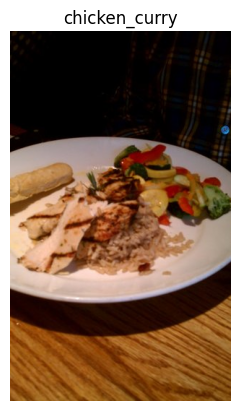

ImageItem(label_name=chicken_curry)

In [23]:
idx = 0
print(f"Predicted Label: {int_to_str[y_pred[misclassified_indices[idx]]]}")
valid_dataset[misclassified_indices[idx]]

Predicted Label: sushi


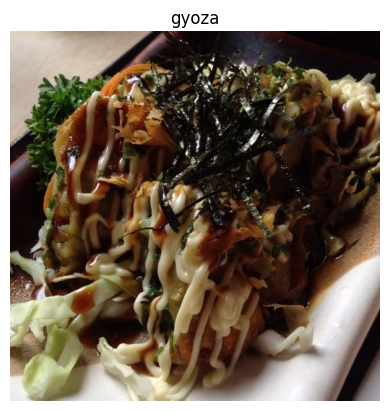

ImageItem(label_name=gyoza)

In [24]:
idx = 1
print(f"Predicted Label: {int_to_str[y_pred[misclassified_indices[idx]]]}")
valid_dataset[misclassified_indices[idx]]

Predicted Label: gyoza


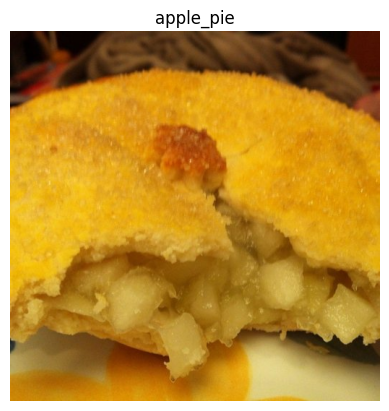

ImageItem(label_name=apple_pie)

In [25]:
idx = 2
print(f"Predicted Label: {int_to_str[y_pred[misclassified_indices[idx]]]}")
valid_dataset[misclassified_indices[idx]]

Predicted Label: apple_pie


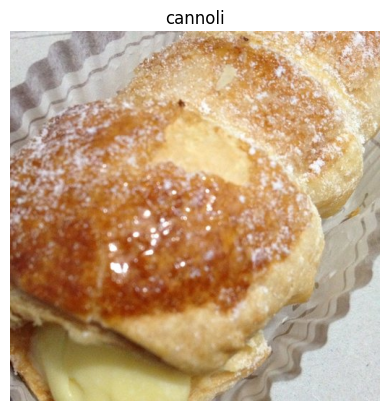

ImageItem(label_name=cannoli)

In [26]:
idx = 6
print(f"Predicted Label: {int_to_str[y_pred[misclassified_indices[idx]]]}")
valid_dataset[misclassified_indices[idx]]

In [27]:
# Let's train a simple classifier on the labeled data (random+cluster) and evaluate it on the validation set.

# Extract the features and labels from the labeled data
# random_sampling_indices contains the indices of the initially selected labeled samples
# train_dataset[idx].embedding accesses the feature vector (embedding) of the image at index idx
X_train = np.array([train_dataset[idx].embedding for idx in random_sampling_indices])
# oracle_fn(train_dataset[idx]) returns the label index for the image at index idx
y_train = np.array([oracle_fn(train_dataset[idx]) for idx in random_sampling_indices])

# Initialize the Logistic Regression model
# random_state ensures reproducibility, n_jobs=-1 uses all available CPU cores, max_iter sets the maximum number of iterations
clf = LogisticRegression(random_state=271828, n_jobs=-1, max_iter=1000)

# Train the model on the labeled data
clf.fit(X_train, y_train)

# Extract the features and labels from the validation data
# valid_dataset.image_items contains all the images in the validation set
X_valid = np.array([image.embedding for image in valid_dataset.image_items])
# oracle_fn(image) returns the label index for the given image
y_valid = np.array([oracle_fn(image) for image in valid_dataset.image_items])

# Get the predictions on the validation data
y_pred = clf.predict(X_valid)

# Evaluate the model on the validation data
helpers.classification.print_classification_metrics(y_valid, y_pred)

Metric                                   Score
Accuracy Score:                        0.84640
Balanced Accuracy Score:               0.84640
F1 Score (weighted):                   0.83449
Cohen Kappa Score:                     0.82933
Matthews Correlation Coefficient:      0.83354

Classification Report:

              precision    recall  f1-score   support

           0       0.96      0.49      0.65       250
           1       0.81      0.89      0.85       250
           2       0.71      0.97      0.82       250
           3       0.77      0.98      0.86       250
           4       0.90      0.99      0.94       250
           5       0.99      0.99      0.99       250
           6       0.98      0.42      0.59       250
           7       0.84      0.92      0.88       250
           8       1.00      0.84      0.91       250
           9       0.75      0.97      0.85       250

    accuracy                           0.85      2500
   macro avg       0.87      0.85      0.83

That's a good start! We've labeled the initial dataset using two different strategies: cluster centers and random sampling. The cluster centers strategy helps ensure that the initial dataset contains representative instances from each class, while random sampling provides a diverse set of examples. These labeled samples will serve as the foundation for our active learning process. Now we can start thinking: how to select the next set of samples to label?

## Uncertainty Sampling

### Introduction to Uncertainty Sampling

**Uncertainty sampling** is an active learning approach that selects instances where the model has low confidence in its predictions. The basic idea is to query the labels for data points that the model finds most uncertain, as these are typically the ones that can improve the model's performance significantly when labeled.

This technique is especially effective in the following situations:
- **Near decision boundaries:** Data points where the model is uncertain often reside close to the boundary separating different classes.
- **Underrepresented or ambiguous regions:** Areas in the feature space with few training examples or ambiguous patterns are identified as having high uncertainty.

<div style="text-align: center;">
  <img src="images/uncertainty_sampling.png" width="70%" height="70%">
  <br>
  <a href="https://www.manning.com/books/human-in-the-loop-machine-learning">Source: Human-in-theLoop Machine Learning</a>
</div>



### Types of Uncertainty

Understanding the various types of uncertainty is essential for effectively carrying out uncertainty sampling. The uncertainty encountered in predictions can be categorized as follows:

1. **Aleatoric Uncertainty**  
 This uncertainty is a result of the data itself and cannot be reduced by improving the model. It arises from factors such as:
   - **Noisy Labels:** Inconsistencies or errors in the provided ground truth.
   - **Ambiguous Instances:** Data points that are difficult to classify even with clear criteria.
   - **Built-In Variability:** Random variations produced during data collection or the natural process generating the data.

2. **Epistemic Uncertainty**  
 This uncertainty comes from the model's limited knowledge due to insufficient or unrepresentative training data. Epistemic uncertainty can be reduced with more data or a more capable model. Key factors include:
   - **Limited Training Data:** Not enough examples to fully capture the patterns in the data.
   - **Model Capacity:** A model with limited complexity might not capture all the nuances of the data.
   - **Training Process:** Inadequate training procedures or suboptimal hyperparameter choices can leave some data characteristics underexplored.

3. **Out-ofDistribution (OOD) Uncertainty**  
 This type of uncertainty occurs when the model encounters data points that differ significantly from its training distribution. Managing OOD uncertainty is important for tasks like:
   - **Anomaly Detection:** Recognizing data points that deviate sharply from the norm.
   - **Novelty Detection:** Identifying examples that represent new or unseen classes.

### Uncertainty Sampling Strategies

Several strategies use uncertainty measures to select which data points should be labeled. The following methods are commonly used:

1. **Least Confident Sampling**  
 This approach selects instances where the model's top prediction has the lowest probability. The idea is to prioritize examples where the model expresses the greatest uncertainty in its prediction:
   
 $$
   x^* = \operatorname{arg\,min}_x \left( 1 - \max_y P(y|x) \right)
   $$
   
 where $ P(y|x) $ is the predicted probability for class $ y $ given instance $ x $.

2. **Margin of Confidence Sampling**  
 This strategy focuses on cases where the difference between the two highest class probabilities is minimal. It is based on the assumption that when two classes are nearly tied, the instance is more uncertain:
   
 $$
   x^* = \operatorname{arg\,min}_x \left( P(y_1|x) - P(y_2|x) \right)
   $$
   
 Here, $ y_1 $ and $ y_2 $ are the predicted classes with the highest and second-highest probabilities, respectively.

3. **Ratio Sampling**  
 Ratio sampling selects instances based on the ratio of the highest to the second-highest predicted probability. When this ratio is close to1, the model shows similar confidence in both classes:
   
 $$
   x^* = \operatorname{arg\,min}_x \left( \frac{P(y_1|x)}{P(y_2|x)} \right)
   $$

4. **Entropy Sampling**  
 Entropy measures the overall uncertainty in the prediction probability distribution. High entropy indicates that the model is unsure across all classes. The entropy $ H(x) $ of an instance is calculated as:
   
 $$
   H(x) = - \sum_{y} P(y|x) \log P(y|x)
   $$
   
 The instance with the highest entropy is then selected:
   
 $$
   x^* = \operatorname{arg\,max}_x\, H(x)
   $$

Each strategy offers a way to quantify uncertainty and, when applied effectively, can lead to significant improvements in model training efficiency. Real-world applications include:
- **Medical Imaging:** Prioritizing uncertain cases for review by specialists.
- **Natural Language Processing:** Selecting ambiguous language examples for expert labeling, especially in sentiment analysis or translation tasks.
- **Finance:** Detecting unusual patterns in transaction data for fraud detection.

> **Note:** The choice of uncertainty sampling strategy depends on the specific problem context and the model's behavior. It is important to evaluate different techniques to determine which provides the most informative samples for a given application.

In [28]:
from tqdm import tqdm
import numpy as np
from helpers.dataset import SimpleImageDataset  # Import our dataset wrapper class


def least_confidence_sampling(
    dataset: SimpleImageDataset, model, n_instances: int, labeled_indices: list[int]
) -> list[int]:
    """
       Selects the least confident instances from the dataset for labeling.
       Based on the idea of least confidence, where uncertainty is measured as1 minus the highest predicted probability.

    Args:
           dataset (SimpleImageDataset): The dataset containing image items.
           model: The model used to predict class probabilities.
           n_instances (int): The number of instances to select.
           labeled_indices (list[int]): The indices of items that have already been labeled.

    Returns:
           list[int]: The indices of the selected unlabeled instances.
    """
    # Identify data indices that have not been labeled yet.
    unlabeled_indices = [
        idx for idx in range(len(dataset)) if idx not in labeled_indices
    ]
    if not unlabeled_indices:
        return []  # No unlabeled instances available

    # Build the feature array for unlabeled items using their embedding
    X_unlabeled = np.array([dataset[idx].embedding for idx in unlabeled_indices])

    # Model predicts class probabilities for each unlabeled instance
    probs = model.predict_proba(X_unlabeled)

    # Calculate uncertainty score for each instance as (1 - max(probability))
    # A higher score infers lower confidence by the model on that instance.
    uncertainty_scores = [
        (idx, 1 - max(prob)) for idx, prob in zip(unlabeled_indices, probs)
    ]

    # Sort items by uncertainty (highest first), so we can label the most ambiguous ones
    uncertainty_scores.sort(key=lambda item: item[1], reverse=True)

    # Select the specified number of most uncertain instances
    selected_indices = [idx for idx, _ in uncertainty_scores[:n_instances]]
    return selected_indices

In [29]:
def margin_of_confidence_sampling(
    dataset: SimpleImageDataset, model, n_instances: int, labeled_indices: list[int]
) -> list[int]:
    """
       Selects instances with the smallest margin between the top two predicted probabilities.
       A smaller margin indicates the model is less certain between its two most likely predictions.

    Args:
           dataset (SimpleImageDataset): The dataset containing image items.
           model: The model used to predict class probabilities.
           n_instances (int): The number of instances to select.
           labeled_indices (list[int]): The indices of already labeled items.

    Returns:
           list[int]: The indices of the selected instances.
    """
    # Determine the indices for unlabeled data points.
    unlabeled_indices = [
        idx for idx in range(len(dataset)) if idx not in labeled_indices
    ]
    if not unlabeled_indices:
        return []  # If no unlabeled items, return empty list

    # Construct a feature matrix for these unlabeled instances.
    X_unlabeled = np.array([dataset[idx].embedding for idx in unlabeled_indices])

    # Get the probability predictions from the model.
    probs = model.predict_proba(X_unlabeled)

    # Compute margin uncertainty as the difference between the highest and second highest probabilities.
    # A smaller margin indicates more uncertainty.
    uncertainty_scores = [
        (idx, sorted(prob, reverse=True)[0] - sorted(prob, reverse=True)[1])
        for idx, prob in zip(unlabeled_indices, probs)
    ]

    # Sort scores in ascending order; lower margins (more uncertainty) come first.
    uncertainty_scores.sort(key=lambda item: item[1])

    # Select top n_instances based on the smallest margin
    selected_indices = [idx for idx, _ in uncertainty_scores[:n_instances]]
    return selected_indices

In [30]:
def ratio_of_confidence_sampling(
    dataset: SimpleImageDataset, model, n_instances: int, labeled_indices: list[int]
) -> list[int]:
    """
       Selects instances with the highest ratio between the second highest and highest probabilities.
       A higher ratio indicates that the model’s confidence in the top prediction isn’t much higher than the runner-up,
       implying uncertainty about the classification.

    Args:
           dataset (SimpleImageDataset): The dataset containing image items.
           model: The model used to predict class probabilities.
           n_instances (int): The number of instances to select.
           labeled_indices (list[int]): The indices of already labeled data.

    Returns:
           list[int]: The indices of the selected instances.
    """
    # Identify unlabeled indices from the dataset.
    unlabeled_indices = [
        idx for idx in range(len(dataset)) if idx not in labeled_indices
    ]
    if not unlabeled_indices:
        return []  # All items are labeled

    # Prepare feature embeddings for the unlabeled dataset items.
    X_unlabeled = np.array([dataset[idx].embedding for idx in unlabeled_indices])

    # Predict class probabilities for these instances.
    probs = model.predict_proba(X_unlabeled)

    # For each prediction, compute the ratio: (second highest probability) / (highest probability)
    # Avoid division by zero by using 'inf' when the highest probability is zero.
    uncertainty_scores = [
        (
            idx,
            (
                (sorted(prob, reverse=True)[1] / sorted(prob, reverse=True)[0])
                if sorted(prob, reverse=True)[0] > 0
                else float("inf")
            ),
        )
        for idx, prob in zip(unlabeled_indices, probs)
    ]

    # Sort by ratio in descending order; higher ratios imply higher uncertainty.
    uncertainty_scores.sort(key=lambda item: item[1], reverse=True)

    # Choose top n_instances with the highest uncertainty ratio.
    selected_indices = [idx for idx, _ in uncertainty_scores[:n_instances]]
    return selected_indices

In [31]:
def entropy_sampling(
    dataset: SimpleImageDataset, model, n_instances: int, labeled_indices: list[int]
) -> list[int]:
    """
       Selects instances with the highest entropy of predicted probabilities.
       Higher entropy reflects that the probabilities are more uniformly distributed, indicating uncertainty.

    Args:
           dataset (SimpleImageDataset): The dataset containing image items.
           model: The model used to predict class probabilities.
           n_instances (int): The number of instances to select.
           labeled_indices (list[int]): The indices of already labeled items.

    Returns:
           list[int]: The indices of the selected instances.
    """
    # Identify indices the dataset that have not yet been labeled.
    unlabeled_indices = [
        idx for idx in range(len(dataset)) if idx not in labeled_indices
    ]
    if not unlabeled_indices:
        return []  # No unlabeled data remains

    # Create an array of feature embeddings for the unlabeled data points.
    X_unlabeled = np.array([dataset[idx].embedding for idx in unlabeled_indices])

    # Get the predicted class probabilities from the model.
    probs = model.predict_proba(X_unlabeled)

    # Calculate the entropy of the probability distribution for each instance.
    # Adding a small constant (1e-12) to prevent log(0) computation errors.
    uncertainty_scores = [
        (idx, -np.sum(prob * np.log(prob + 1e-12)))
        for idx, prob in zip(unlabeled_indices, probs)
    ]

    # Sort instances by entropy in descending order; instances with higher entropy (more uncertainty) come first.
    uncertainty_scores.sort(key=lambda item: item[1], reverse=True)

    # Select the top n_instances with the highest entropy scores.
    selected_indices = [idx for idx, _ in uncertainty_scores[:n_instances]]
    return selected_indices

In [32]:
from copy import deepcopy
from tqdm import trange

# Test the uncertainty sampling strategies on the initial dataset

# Initialize the Logistic Regression model
# random_state ensures reproducibility, n_jobs=-1 uses all available CPU cores, max_iter sets the maximum number of iterations
clf = LogisticRegression(random_state=271828, n_jobs=-1, max_iter=1000)

# Train the model on the labeled data
# X_train and y_train contain the features and labels of the initially labeled samples
clf.fit(X_train, y_train)


def execute_sampling_in_batches(
    sampling_fn,
    dataset,
    clf,
    batch_size,
    labeled_indices,
    n_instances,
):
    selected_indices = deepcopy(labeled_indices)
    for _ in trange(n_instances // batch_size):
        selected_indices.extend(sampling_fn(dataset, clf, batch_size, selected_indices))
    return list(set([idx for idx in selected_indices if idx not in labeled_indices]))

In [33]:
# Select 250 instances using each uncertainty sampling strategy in batches of 10
# Each function returns the indices of the selected instances based on the specified strategy
n_instances = 250
batch_size = 10

In [34]:
# Least Confidence Sampling: Selects instances where the model is least confident
least_confidence_indices = execute_sampling_in_batches(
    least_confidence_sampling,
    train_dataset,
    clf,
    batch_size,
    random_sampling_indices,
    n_instances,
)

100%|██████████| 25/25 [00:02<00:00,  8.77it/s]


In [35]:
# Margin of Confidence Sampling: Selects instances with the smallest margin between the top two predicted probabilities
margin_of_confidence_indices = execute_sampling_in_batches(
    margin_of_confidence_sampling,
    train_dataset,
    clf,
    batch_size,
    random_sampling_indices,
    n_instances,
)

  0%|          | 0/25 [00:00<?, ?it/s]

100%|██████████| 25/25 [00:03<00:00,  7.64it/s]


In [36]:
# Ratio of Confidence Sampling: Selects instances with the highest ratio between the top two predicted probabilities
ratio_of_confidence_indices = execute_sampling_in_batches(
    ratio_of_confidence_sampling,
    train_dataset,
    clf,
    batch_size,
    random_sampling_indices,
    n_instances,
)

100%|██████████| 25/25 [00:03<00:00,  6.98it/s]


In [37]:
# Entropy Sampling: Selects instances with the highest entropy in their predicted probabilities
entropy_indices = execute_sampling_in_batches(
    entropy_sampling,
    train_dataset,
    clf,
    batch_size,
    random_sampling_indices,
    n_instances,
)

100%|██████████| 25/25 [00:03<00:00,  7.21it/s]


In [38]:
# Completely random sampling: Selects instances randomly as a baseline
completely_random_indices = list(
    RNG.choice(unlabeled_indices, size=n_instances, replace=False)
)

In [39]:
# Display the selected indices for each sampling strategy
len(least_confidence_indices), len(margin_of_confidence_indices), len(
    ratio_of_confidence_indices
), len(entropy_indices), len(completely_random_indices)

(250, 250, 250, 250, 250)

In [40]:
from sklearn.linear_model import (
    LogisticRegression,
)
from helpers.classification import print_classification_metrics


def train_and_evaluate_model(
    train_dataset,
    valid_dataset,
    labeled_indices: list[int],
    selected_indices: list[int],
) -> tuple[float, float, float]:
    """
    Trains a Logistic Regression model on the selected labeled data and evaluates it on the validation data.

    Args:
        train_dataset: The training dataset containing image items.
        valid_dataset: The validation dataset containing image items.
        labeled_indices (list[int]): The indices of already labeled instances.
        selected_indices (list[int]): The indices of newly selected instances.

    Returns:
        tuple[float, float, float]: The accuracy, F1 score, and Matthews Correlation Coefficient on the validation data.
    """
    # Combine the initial labeled indices with the newly selected indices
    updated_labeled_indices = list(set(labeled_indices + selected_indices))

    # Extract features and labels for training
    # X_train contains the feature vectors (embeddings) of the selected labeled samples
    # y_train contains the corresponding labels
    X_train = np.array(
        [train_dataset[idx].embedding for idx in updated_labeled_indices]
    )
    y_train = np.array(
        [oracle_fn(train_dataset[idx]) for idx in updated_labeled_indices]
    )

    # Initialize and train the Logistic Regression model
    clf = LogisticRegression(random_state=271828, n_jobs=-1, max_iter=1000)
    clf.fit(X_train, y_train)

    # Extract features and labels from the validation data
    # X_valid contains the feature vectors (embeddings) of the validation samples
    # y_valid contains the corresponding labels
    X_valid = np.array([image.embedding for image in valid_dataset.image_items])
    y_valid = np.array([oracle_fn(image) for image in valid_dataset.image_items])

    # Get the predictions on the validation data
    y_pred = clf.predict(X_valid)

    metrics = print_classification_metrics(y_valid, y_pred, return_metrics=True)

    accuracy = metrics["Accuracy"]
    f1_score = metrics["F1 Score (weighted)"]
    mcc = metrics["Matthews Correlation Coefficient"]

    return accuracy, f1_score, mcc, len(updated_labeled_indices)

In [41]:
# Initialize an empty list to store the results of different sampling strategies
results = []

# Evaluate the model using Least Confidence Sampling
print("Least Confidence Sampling:")
# Train and evaluate the model using the least confident samples
# Append the results (sampling strategy name and evaluation metrics) to the results list
r = train_and_evaluate_model(
    train_dataset, valid_dataset, random_sampling_indices, least_confidence_indices
)
results.append(("Least Confidence Sampling", *r))

Least Confidence Sampling:
Metric                                   Score
Accuracy Score:                        0.90600
Balanced Accuracy Score:               0.90600
F1 Score (weighted):                   0.90676
Cohen Kappa Score:                     0.89556
Matthews Correlation Coefficient:      0.89616

Classification Report:

              precision    recall  f1-score   support

           0       0.72      0.86      0.78       250
           1       0.82      0.86      0.84       250
           2       0.97      0.90      0.93       250
           3       0.97      0.85      0.90       250
           4       0.99      0.97      0.98       250
           5       1.00      0.99      0.99       250
           6       0.87      0.97      0.92       250
           7       0.92      0.93      0.92       250
           8       0.90      0.97      0.94       250
           9       0.97      0.77      0.86       250

    accuracy                           0.91      2500
   macro avg    

In [42]:
# Evaluate the model using Margin of Confidence Sampling
print("\nMargin of Confidence Sampling:")
# Train and evaluate the model using the samples with the smallest margin between the top two predicted probabilities
r = train_and_evaluate_model(
    train_dataset, valid_dataset, random_sampling_indices, margin_of_confidence_indices
)
results.append(("Margin of Confidence Sampling", *r))


Margin of Confidence Sampling:
Metric                                   Score
Accuracy Score:                        0.92240
Balanced Accuracy Score:               0.92240
F1 Score (weighted):                   0.92347
Cohen Kappa Score:                     0.91378
Matthews Correlation Coefficient:      0.91451

Classification Report:

              precision    recall  f1-score   support

           0       0.74      0.96      0.84       250
           1       0.90      0.80      0.85       250
           2       0.98      0.92      0.95       250
           3       0.97      0.89      0.93       250
           4       0.99      0.96      0.98       250
           5       1.00      0.97      0.99       250
           6       0.86      0.99      0.92       250
           7       0.93      0.91      0.92       250
           8       0.96      0.96      0.96       250
           9       0.97      0.86      0.91       250

    accuracy                           0.92      2500
   macro av

In [43]:
# Evaluate the model using Ratio of Confidence Sampling
print("\nRatio of Confidence Sampling:")
# Train and evaluate the model using the samples with the highest ratio between the top two predicted probabilities
r = train_and_evaluate_model(
    train_dataset, valid_dataset, random_sampling_indices, ratio_of_confidence_indices
)
results.append(("Ratio of Confidence Sampling", *r))


Ratio of Confidence Sampling:
Metric                                   Score
Accuracy Score:                        0.91720
Balanced Accuracy Score:               0.91720
F1 Score (weighted):                   0.91801
Cohen Kappa Score:                     0.90800
Matthews Correlation Coefficient:      0.90871

Classification Report:

              precision    recall  f1-score   support

           0       0.74      0.95      0.83       250
           1       0.90      0.78      0.84       250
           2       0.97      0.91      0.94       250
           3       0.97      0.88      0.92       250
           4       0.99      0.97      0.98       250
           5       1.00      0.95      0.98       250
           6       0.88      1.00      0.93       250
           7       0.93      0.90      0.91       250
           8       0.93      0.95      0.94       250
           9       0.93      0.88      0.91       250

    accuracy                           0.92      2500
   macro avg

In [44]:
# Evaluate the model using Entropy Sampling
print("\nEntropy Sampling:")
# Train and evaluate the model using the samples with the highest entropy in their predicted probabilities
r = train_and_evaluate_model(
    train_dataset, valid_dataset, random_sampling_indices, entropy_indices
)
results.append(("Entropy Sampling", *r))


Entropy Sampling:
Metric                                   Score
Accuracy Score:                        0.91040
Balanced Accuracy Score:               0.91040
F1 Score (weighted):                   0.91039
Cohen Kappa Score:                     0.90044
Matthews Correlation Coefficient:      0.90112

Classification Report:

              precision    recall  f1-score   support

           0       0.80      0.83      0.81       250
           1       0.78      0.93      0.85       250
           2       0.97      0.92      0.95       250
           3       0.95      0.89      0.92       250
           4       0.98      0.96      0.97       250
           5       1.00      0.99      0.99       250
           6       0.92      0.95      0.93       250
           7       0.92      0.92      0.92       250
           8       0.87      0.98      0.92       250
           9       0.99      0.73      0.84       250

    accuracy                           0.91      2500
   macro avg       0.92 

In [45]:
# Evaluate the model using Random Sampling as a baseline
print("\nRandom Sampling:")
# Train and evaluate the model using randomly selected samples
r = train_and_evaluate_model(
    train_dataset, valid_dataset, random_sampling_indices, completely_random_indices
)
results.append(("Random Sampling", *r))


Random Sampling:
Metric                                   Score
Accuracy Score:                        0.93280
Balanced Accuracy Score:               0.93280
F1 Score (weighted):                   0.93285
Cohen Kappa Score:                     0.92533
Matthews Correlation Coefficient:      0.92550

Classification Report:

              precision    recall  f1-score   support

           0       0.89      0.87      0.88       250
           1       0.87      0.92      0.89       250
           2       0.95      0.94      0.95       250
           3       0.89      0.98      0.94       250
           4       0.98      0.99      0.98       250
           5       0.99      0.98      0.98       250
           6       0.91      0.96      0.93       250
           7       0.95      0.91      0.93       250
           8       1.00      0.88      0.94       250
           9       0.91      0.90      0.91       250

    accuracy                           0.93      2500
   macro avg       0.93  

In [46]:
# Evaluate the model using Full Supervision (all labels)
print("\nFull Supervision (all labels):")
# Train and evaluate the model using all samples
r = train_and_evaluate_model(
    train_dataset,
    valid_dataset,
    random_sampling_indices,
    list(range(len(train_dataset))),
)
results.append(("Full Supervision (all labels)", *r))


Full Supervision (all labels):
Metric                                   Score
Accuracy Score:                        0.96040
Balanced Accuracy Score:               0.96040
F1 Score (weighted):                   0.96039
Cohen Kappa Score:                     0.95600
Matthews Correlation Coefficient:      0.95602

Classification Report:

              precision    recall  f1-score   support

           0       0.92      0.92      0.92       250
           1       0.93      0.94      0.94       250
           2       0.97      0.94      0.96       250
           3       0.96      0.97      0.97       250
           4       0.98      0.99      0.99       250
           5       1.00      0.99      0.99       250
           6       0.95      0.99      0.97       250
           7       0.96      0.95      0.95       250
           8       0.97      0.97      0.97       250
           9       0.96      0.94      0.95       250

    accuracy                           0.96      2500
   macro av

In [47]:
def show_results(r):
    return pd.DataFrame(
        r,
        columns=[
            "Sampling Strategy",
            "Accuracy",
            "F1 Score",
            "Matthews Correlation Coefficient",
            "Training Size",
        ],
    ).sort_values("Matthews Correlation Coefficient", ascending=False)

In [48]:
show_results(results)

,Sampling Strategy,Accuracy,F1 Score,Matthews Correlation Coefficient,Training Size
5,Full Supervision (all labels),0.9604,0.960389,0.956019,7500
4,Random Sampling,0.9328,0.932846,0.925496,300
1,Margin of Confidence Sampling,0.9224,0.923470,0.914514,300
2,Ratio of Confidence Sampling,0.9172,0.918013,0.908707,300
3,Entropy Sampling,0.9104,0.910387,0.901119,300
0,Least Confidence Sampling,0.9060,0.906764,0.896156,300


## Query by Committee (QBC)

<div style="text-align: center;">
<img src="images/qbc.png" width="70%" height="70%">
<br>
<a href="https://www.manning.com/books/human-in-the-loop-machine-learning">Source: Human-in-the-Loop Machine Learning</a>
</div>


Query by Committee (QBC) is an active learning strategy that uses multiple models to guide the learning process. The method selects the unlabeled data points on which the models disagree most, thus focusing labeling efforts where additional information is likely to be the most useful.

### Constructing a Committee of Models

In QBC, a set of models—a committee—is created by training several models on the current labeled dataset. The models in the committee can differ by:

- **Algorithm Type**: Using different learning algorithms to capture varied assumptions about the data.
- **Hyperparameters**: Adjusting settings in the same type of model can produce different decision boundaries.
- **Data Subsets**: Training on different samples or different views of the data to enhance diversity.

This diversity is key because it allows the committee to offer multiple viewpoints on the data, increasing the chance that areas of uncertainty or disagreement are detected.

### Measuring Disagreement Among Models

The next step in QBC is to identify which data points produce conflicting predictions among the models. This disagreement indicates uncertainty about those data points and marks them as prime candidates for labeling. Two common measures used to assess disagreement are **Vote Entropy** and **Kullback-Leibler (KL) Divergence**.

#### Vote Entropy

Vote entropy quantifies how varied the predictions are when each model in the committee casts a "vote" for the output class of a data point.

- **Calculation**: For each data point, the predictions (votes) from each model are collected, creating a distribution over the possible classes. The entropy of this distribution is then calculated using the formula:

  $$
  H(p) = -\sum_{i=1}^{C} p_i \log(p_i)
  $$

  where $ C $ is the number of classes and $ p_i $ is the proportion of votes for class $ i $.

- **Interpretation**:
  - A **low vote entropy** indicates that most models agree on one class.
  - A **high vote entropy** implies that the models are distributed among multiple classes, pointing to uncertainty.

- **Example**:  
 Consider a committee of 5 models where the vote distribution for a data point over three classes is $[3, 2, 0]$. Here, the modest spread among classes suggests uncertainty compared to a unanimous vote of $[5, 0, 0]$.

#### Kullback-Leibler (KL) Divergence

KL divergence measures the difference between the full probability distributions predicted by two models for a given data point.

- **Calculation**: If one model predicts the distribution $ P = [p_1, p_2, \ldots, p_C] $ and another model predicts $ Q = [q_1, q_2, \ldots, q_C] $, the divergence is defined as:

  $$
  D_{\text{KL}}(P \parallel Q) = \sum_{i=1}^{C} p_i \log\left(\frac{p_i}{q_i}\right)
  $$

- **Interpretation**:  
 A larger value of $ D_{\text{KL}}(P \parallel Q) $ indicates a greater difference between the two distributions. When extended to a full committee, aggregated divergence measures help highlight the data points with the greatest overall disagreement.

- **Example**:  
 If one model outputs $[0.7, 0.2, 0.1]$ and another outputs $[0.4, 0.4, 0.2]$, the computed KL divergence will represent the degree to which these predictions differ. A higher divergence signals that the models disagree on the data point’s classification.

### When to Use Each Measure

Choosing between vote entropy and KL divergence depends on the outputs provided by the models:

- **Vote Entropy**:  
  - Best suited for models that produce a single, hard classification.  
  - Simple to calculate and interpret when probability distributions are not available.

- **KL Divergence**:  
  - Appropriate when models output complete probability distributions over classes.  
  - Provides a more detailed comparison of the predictions, capturing subtle differences in uncertainty.

> **Note**: Experimenting with both measures may be necessary because the effectiveness of each can vary depending on the problem and the specific behavior of the ensemble.

### Key Points to Remember

- **Committee Construction**: Use a diverse group of models to capture different perspectives on the data.
- **Disagreement Assessment**: Identify uncertainties by computing either vote entropy or KL divergence.
- **Measure Selection**: Choose vote entropy for hard classification outputs and KL divergence for models that supply probability distributions.


Let's see how to carry out Query by Committee (QBC) in an active learning setting.

In [49]:
import numpy as np  # Import numpy for numerical operations
from collections import Counter  # Import Counter for counting occurrences
from scipy.special import (
    rel_entr,
)  # Import rel_entr for computing relative entropy (KL divergence)


def qbc_vote_entropy(dataset, committee, n_instances, labeled_indices):
    """
    Selects instances based on vote entropy from a committee of models.

    Args:
        dataset: The dataset containing image items.
        committee: A list of models used for making predictions.
        n_instances (int): The number of instances to select.
        labeled_indices: The indices of already labeled instances.

    Returns:
        List[int]: The indices of the selected instances.
    """
    # Get indices of unlabeled data points
    unlabeled_indices = [
        idx for idx in range(len(dataset)) if idx not in labeled_indices
    ]

    if not unlabeled_indices:
        return []

    # Extract embeddings of unlabeled data points
    X_unlabeled = [dataset[idx].embedding for idx in unlabeled_indices]

    # Get predictions from each model in the committee
    committee_predictions = []
    for model in committee:
        # Predict class labels
        preds = model.predict(X_unlabeled)
        committee_predictions.append(preds)

    # Transpose the predictions to get per-instance predictions
    # Now, committee_predictions shape: (n_unlabeled, n_committee_members)
    committee_predictions = np.array(committee_predictions).T

    # Compute vote entropy for each unlabeled instance
    uncertainty_scores = []
    for idx, votes in zip(unlabeled_indices, committee_predictions):
        # Count votes for each class
        vote_counts = Counter(votes)
        total_votes = sum(vote_counts.values())
        # Compute probabilities for each class
        vote_probs = np.array([count / total_votes for count in vote_counts.values()])
        # Compute entropy of the vote distribution
        vote_entropy = -np.sum(
            vote_probs * np.log(vote_probs + 1e-12)
        )  # Add small value to avoid log(0)
        uncertainty_scores.append((idx, vote_entropy))

    # Sort the scores in descending order of vote entropy
    uncertainty_scores.sort(key=lambda x: x[1], reverse=True)

    # Ensure n_instances does not exceed the number of unlabeled instances
    n_instances = min(n_instances, len(uncertainty_scores))

    # Select top n_instances indices
    selected_indices = [idx for idx, _ in uncertainty_scores[:n_instances]]

    # Return the list of indices that have been labeled
    return selected_indices

In [50]:
def qbc_kl_divergence(dataset, committee, n_instances, labeled_indices):
    """
    Selects instances based on KL divergence from a committee of models.

    Args:
        dataset: The dataset containing image items.
        committee: A list of models used for making predictions.
        n_instances (int): The number of instances to select.
        labeled_indices: The indices of already labeled instances.

    Returns:
        List[int]: The indices of the selected instances.
    """
    # Get indices of unlabeled data points
    unlabeled_indices = [
        idx for idx in range(len(dataset)) if idx not in labeled_indices
    ]

    if not unlabeled_indices:
        return []

    # Extract embeddings of unlabeled data points
    X_unlabeled = [dataset[idx].embedding for idx in unlabeled_indices]

    # Get probability predictions from each model in the committee
    committee_prob_predictions = []
    for model in committee:
        # Predict class probabilities
        probs = model.predict_proba(X_unlabeled)
        committee_prob_predictions.append(probs)

    # Convert to numpy array for easier manipulation
    # Shape: (n_committee_members, n_unlabeled, n_classes)
    committee_prob_predictions = np.array(committee_prob_predictions)

    # Compute average probability distribution across the committee
    # Shape: (n_unlabeled, n_classes)
    avg_prob_predictions = np.mean(committee_prob_predictions, axis=0)

    # Compute KL divergence for each model's predictions against the average prediction
    # Then sum the divergences to get the total disagreement for each instance
    uncertainty_scores = []

    for idx_in_list, idx in enumerate(unlabeled_indices):
        total_kl_divergence = 0
        avg_probs = avg_prob_predictions[idx_in_list]

        for model_probs in committee_prob_predictions[:, idx_in_list, :]:
            # Compute KL divergence between model's prediction and average prediction
            kl_div = np.sum(rel_entr(model_probs + 1e-12, avg_probs + 1e-12))
            total_kl_divergence += kl_div

        uncertainty_scores.append((idx, total_kl_divergence))

    # Sort the scores in descending order of total KL divergence
    uncertainty_scores.sort(key=lambda x: x[1], reverse=True)

    # Ensure n_instances does not exceed the number of unlabeled instances
    n_instances = min(n_instances, len(uncertainty_scores))

    # Select top n_instances indices
    selected_indices = [idx for idx, _ in uncertainty_scores[:n_instances]]

    # Return the list of indices that have been labeled
    return selected_indices

In [51]:
from sklearn.linear_model import (
    LogisticRegression,
)
from sklearn.ensemble import (
    RandomForestClassifier,
    ExtraTreesClassifier,
)
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

# Define a list of different classifiers to form the committee
committee_members = [
    LogisticRegression(random_state=271828, n_jobs=-1, max_iter=1000),
    RandomForestClassifier(random_state=271828, n_jobs=-1),
    ExtraTreesClassifier(random_state=271828, n_jobs=-1),
    LGBMClassifier(random_state=271828, n_jobs=-1, verbosity=-1),
    XGBClassifier(random_state=271828, n_jobs=-1),
]

In [52]:
# Initialize an empty list to store the committee models
committee = []

In [53]:
# Create a committee of models
for i in range(len(committee_members)):
    # Initialize each model from the committee_members list
    model = committee_members[i]

    # Initialize a random number generator with a unique seed for each model
    RNG = np.random.default_rng(271828 + i)

    # Use bootstrapping to create a diverse training set for each model
    bootstrap_indices = RNG.choice(
        random_sampling_indices, size=len(random_sampling_indices), replace=False
    )

    # Extract features and labels for the bootstrapped training set
    X_bootstrap = np.array([train_dataset[idx].embedding for idx in bootstrap_indices])
    y_bootstrap = np.array([oracle_fn(train_dataset[idx]) for idx in bootstrap_indices])

    # Train the model on the bootstrapped training set
    model.fit(X_bootstrap, y_bootstrap)

    # Add the trained model to the committee
    committee.append(model)

In [54]:
# Query by Committee (QBC) with Vote Entropy
# Select 250 instances in batches of 10 based on vote entropy from the committee
qbc_vote_entropy_selected_indices = deepcopy(random_sampling_indices)
for i in trange(25):
    qbc_vote_entropy_selected_indices.extend(
        qbc_vote_entropy(
            train_dataset,
            committee,
            n_instances=10,
            labeled_indices=qbc_vote_entropy_selected_indices,
        )
    )

100%|██████████| 25/25 [00:08<00:00,  2.98it/s]


In [55]:
# Query by Committee (QBC) with KL Divergence
# Select 250 instances in batches of 10 based on KL divergence from the committee
qbc_kl_divergence_selected_indices = deepcopy(random_sampling_indices)
for i in trange(25):
    qbc_kl_divergence_selected_indices.extend(
        qbc_kl_divergence(
            train_dataset,
            committee,
            n_instances=10,
            labeled_indices=qbc_kl_divergence_selected_indices,
        )
    )

  0%|          | 0/25 [00:00<?, ?it/s]

100%|██████████| 25/25 [00:10<00:00,  2.35it/s]


In [56]:
# Remove duplicates and ensure the selected indices are not in the initial random sampling indices
qbc_vote_entropy_selected_indices = list(set(qbc_vote_entropy_selected_indices))
qbc_vote_entropy_selected_indices = [
    i for i in qbc_vote_entropy_selected_indices if i not in random_sampling_indices
]

qbc_kl_divergence_selected_indices = list(set(qbc_kl_divergence_selected_indices))
qbc_kl_divergence_selected_indices = [
    i for i in qbc_kl_divergence_selected_indices if i not in random_sampling_indices
]

# Display the number of selected indices for each strategy
len(qbc_vote_entropy_selected_indices), len(qbc_kl_divergence_selected_indices)

(250, 250)

In [57]:
r = train_and_evaluate_model(
    train_dataset,
    valid_dataset,
    random_sampling_indices,
    qbc_vote_entropy_selected_indices,
)
results.append(("QBC with Vote Entropy Sampling", *r))

Metric                                   Score
Accuracy Score:                        0.93120
Balanced Accuracy Score:               0.93120
F1 Score (weighted):                   0.93170
Cohen Kappa Score:                     0.92356
Matthews Correlation Coefficient:      0.92384

Classification Report:

              precision    recall  f1-score   support

           0       0.80      0.94      0.87       250
           1       0.90      0.86      0.88       250
           2       0.96      0.93      0.95       250
           3       0.96      0.93      0.94       250
           4       0.99      0.98      0.98       250
           5       1.00      0.95      0.98       250
           6       0.89      0.99      0.94       250
           7       0.97      0.88      0.92       250
           8       0.96      0.95      0.95       250
           9       0.92      0.90      0.91       250

    accuracy                           0.93      2500
   macro avg       0.93      0.93      0.93

In [58]:
r = train_and_evaluate_model(
    train_dataset,
    valid_dataset,
    random_sampling_indices,
    qbc_kl_divergence_selected_indices,
)
results.append(("QBC with KL Divergence Sampling", *r))

Metric                                   Score
Accuracy Score:                        0.94680
Balanced Accuracy Score:               0.94680
F1 Score (weighted):                   0.94674
Cohen Kappa Score:                     0.94089
Matthews Correlation Coefficient:      0.94094

Classification Report:

              precision    recall  f1-score   support

           0       0.90      0.88      0.89       250
           1       0.90      0.89      0.90       250
           2       0.95      0.97      0.96       250
           3       0.92      0.97      0.95       250
           4       0.97      0.98      0.98       250
           5       1.00      0.98      0.99       250
           6       0.93      0.97      0.95       250
           7       0.97      0.93      0.95       250
           8       1.00      0.95      0.97       250
           9       0.94      0.94      0.94       250

    accuracy                           0.95      2500
   macro avg       0.95      0.95      0.95

In [59]:
show_results(results)

,Sampling Strategy,Accuracy,F1 Score,Matthews Correlation Coefficient,Training Size
5,Full Supervision (all labels),0.9604,0.960389,0.956019,7500
7,QBC with KL Divergence Sampling,0.9468,0.946744,0.940944,300
4,Random Sampling,0.9328,0.932846,0.925496,300
6,QBC with Vote Entropy Sampling,0.9312,0.931702,0.923836,300
1,Margin of Confidence Sampling,0.9224,0.923470,0.914514,300
2,Ratio of Confidence Sampling,0.9172,0.918013,0.908707,300
3,Entropy Sampling,0.9104,0.910387,0.901119,300
0,Least Confidence Sampling,0.9060,0.906764,0.896156,300


## Diversity Sampling

Diversity sampling is an active learning strategy focused on selecting a set of examples that collectively represent numerous patterns present in the full data distribution. The main objective is to create a labeled dataset that captures various trends and structures, ensuring that the model is exposed to a representative set of instances. This approach is especially helpful when the initial labeled set does not cover some areas of the feature space or when the available data is imbalanced.

<div style="text-align: center;">
  <img src="images/diversity_sampling.png" width="70%" height="70%">
  <br>
  <a href="https://www.manning.com/books/human-in-the-loop-machine-learning">Source: Human-in-theLoop Machine Learning</a>
</div>

### Importance of Diversity in Active Learning

Diversity sampling in active learning provides several advantages:

1. **Generalization of the Model:**  
 By including a wide variety of instances from the data distribution, the model learns patterns that are more likely to apply to unseen examples. This reduces the risk of overfitting to a narrow subset of the data.

2. **Bias Mitigation:**  
 A biased labeled dataset can lead the model to favor certain classes or patterns. By actively sampling diverse instances, the process reduces the impact of these biases, leading to fairer predictions.

3. **Labeling Efficiency:**  
 Active learning seeks to minimize the cost associated with obtaining labels. By selecting examples that are both diverse and representative, fewer labeled instances may be needed to reach a desired level of performance.

4. **Improved Robustness:**  
 Exposure to a diverse set of examples makes the model better prepared to handle variations in the input data. This robustness is crucial when the model faces real-world data that may differ from the initial training set.

### Methods for Diversity Sampling

There are several techniques to execute diversity sampling in active learning. Below are the common methods along with an overview of their principles and benefits:

1. **Cluster-Based Sampling:**
   - **Concept:**  
     Unlabeled data is first divided into clusters using a clustering algorithm. Then, representative instances are chosen from each cluster.
   - **Reasoning:**  
     Each cluster represents a distinct area of the feature space. By picking samples from all clusters, diversity is naturally enforced.
   - **Case Example:**  
     In a dataset that is partitioned into ten clusters, selecting one instance per cluster ensures that examples from all regions are considered.

2. **Key-Set Selection:**
   - **Concept:**  
     Identify a subset of data points that best represent the entire dataset.
   - **Technique:**  
     Methods such as the k-center greedy algorithm are used. The selected points maximize the minimum distance to already chosen points. This can be mathematically expressed as finding a set $ S $ such that:
     $$
     \max_{x \in U} \min_{s \in S} \| x - s \|
     $$
     where $ U $ is the set of all unlabeled data points, and $\|\cdot\| $ denotes a distance measure.
   - **Benefit:**  
     This method ensures coverage over various areas of the feature space, creating a subset that is indicative of the full dataset.

3. **Disagreement-Based Sampling:**
   - **Concept:**  
     Use predictions from multiple models (or the same model under slightly different conditions) on the unlabeled data.  
 - **Principle:**  
     The instances on which these predictions differ the most are selected for labeling.
   - **Advantage:**  
     The areas of disagreement indicate regions of uncertainty where the model may benefit from additional labeled information.

4. **Density-Weighted Sampling:**
   - **Concept:**  
     Combine uncertainty sampling with data density.  
 - **Method:**  
     Select instances that are not only uncertain but also situated in dense regions of the feature space.
   - **Benefit:**  
     This approach ensures that labeled instances provide valuable insights about frequently occurring patterns in the data distribution.

### Practical Considerations

When applying diversity sampling, several factors should be taken into account:

1. **Computational Complexity:**  
 Some methods, such as cluster-based sampling, can be computationally demanding, especially when dealing with large datasets. It is important to balance the trade-off between achieving diversity and managing available computational resources.

2. **Combining with Uncertainty Sampling:**  
 Often, the best outcomes are achieved by using a hybrid approach that selects instances based on both diversity and the degree of uncertainty. This combination can help target areas where the model is both underexposed and unsure about its predictions.

3. **Performance Evaluation:**  
 Regular evaluation on a separate validation set is necessary to measure the effectiveness of the diversity sampling strategy. Adjustments may be required based on the model's performance during training.

> **Note:** Diversity sampling is valuable when used alongside other data selection strategies. A balanced approach that includes considerations for uncertainty helps maximize model performance and makes efficient use of labeling resources.


In [60]:
import numpy as np
from sklearn.cluster import KMeans  # Import KMeans clustering from scikit-learn


def cluster_based_sampling(dataset, n_instances, labeled_indices, n_clusters):
    """
    Selects instances based on clustering from the dataset.

    Args:
        dataset: The dataset containing image items.
        n_instances (int): The number of instances to select.
        labeled_indices: The indices of already labeled instances.
        n_clusters (int): The number of clusters to form.

    Returns:
        List[int]: The indices of the selected instances.
    """
    # Get indices of unlabeled data points
    unlabeled_indices = [
        idx for idx in range(len(dataset)) if idx not in labeled_indices
    ]

    # If there are no unlabeled data points, return an empty list
    if not unlabeled_indices:
        return []

    # Extract features of unlabeled data points
    X_unlabeled = np.array([dataset[idx].embedding for idx in unlabeled_indices])

    # Perform clustering on the unlabeled data
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(X_unlabeled)

    # Initialize an empty list to store the selected indices
    selected_indices = []

    # Select one representative from each cluster
    for cluster in range(n_clusters):
        # Get the indices of data points in the current cluster
        cluster_indices = [
            unlabeled_indices[idx] for idx in np.where(cluster_labels == cluster)[0]
        ]
        if not cluster_indices:
            continue
        # Select a random instance from the cluster
        selected_idx = np.random.choice(cluster_indices)
        selected_indices.append(selected_idx)
        # If we have selected enough instances, break the loop
        if len(selected_indices) >= n_instances:
            break

    # If we haven't reached n_instances, select additional instances randomly
    if len(selected_indices) < n_instances:
        # Get the remaining unlabeled indices that have not been selected
        remaining_indices = list(set(unlabeled_indices) - set(selected_indices))
        # Select additional instances randomly from the remaining indices
        additional_indices = np.random.choice(
            remaining_indices, n_instances - len(selected_indices), replace=False
        )
        selected_indices.extend(additional_indices)

    # Return the list of indices that have been labeled
    return selected_indices

In [61]:
from sklearn.metrics.pairwise import (
    euclidean_distances,
)  # Import euclidean_distances for distance calculations


def core_set_selection(dataset, n_instances, labeled_indices):
    """
    Selects instances based on their distance from the labeled set (Core-Set Selection).

    Args:
        dataset: The dataset containing image items.
        n_instances (int): The number of instances to select.
        labeled_indices: The indices of already labeled instances.

    Returns:
        List[int]: The indices of the selected instances.
    """
    # Get indices of unlabeled data points
    unlabeled_indices = [
        idx for idx in range(len(dataset)) if idx not in labeled_indices
    ]
    # Extract embeddings of labeled data points
    labeled_set = [dataset[idx].embedding for idx in labeled_indices]

    # If there are no unlabeled or labeled data points, return an empty list
    if not unlabeled_indices or not labeled_set:
        return []

    # Extract features of unlabeled data points
    X_unlabeled = np.array([dataset[idx].embedding for idx in unlabeled_indices])

    # Compute distances between unlabeled instances and labeled instances
    distances = euclidean_distances(X_unlabeled, labeled_set)

    # Find the minimum distance to any labeled instance for each unlabeled instance
    min_distances = distances.min(axis=1)

    # Pair each unlabeled index with its minimum distance
    uncertainty_scores = list(zip(unlabeled_indices, min_distances))
    # Sort the pairs by distance in descending order (farthest first)
    uncertainty_scores.sort(key=lambda x: x[1], reverse=True)

    # Ensure n_instances does not exceed the number of unlabeled instances
    n_instances = min(n_instances, len(uncertainty_scores))

    # Select top n_instances indices
    selected_indices = [idx for idx, _ in uncertainty_scores[:n_instances]]

    # Return the list of indices that have been labeled
    return selected_indices

In [62]:
def diversity_uncertainty_sampling(dataset, model, n_instances, labeled_indices):
    """
    Selects instances based on both uncertainty and diversity using clustering.

    Args:
        dataset: The dataset containing image items.
        model: The model used to predict probabilities.
        n_instances (int): The number of instances to select.
        labeled_indices: The indices of already labeled instances.

    Returns:
        List[int]: The indices of the selected instances.
    """
    # Get indices of unlabeled data points
    unlabeled_indices = [
        idx for idx in range(len(dataset)) if idx not in labeled_indices
    ]

    # If there are no unlabeled data points, return an empty list
    if not unlabeled_indices:
        return []

    # Extract features of unlabeled data points
    X_unlabeled = [dataset[idx].embedding for idx in unlabeled_indices]

    # Predict probabilities for the unlabeled data points
    probs = model.predict_proba(X_unlabeled)

    # Compute uncertainties as 1 - max(probabilities)
    uncertainties = 1 - np.max(probs, axis=1)

    # Perform clustering on the unlabeled data
    n_clusters = 10  # Set the number of clusters
    kmeans = KMeans(n_clusters=n_clusters, random_state=271828)
    cluster_labels = kmeans.fit_predict(X_unlabeled)

    # Initialize an empty list to store the selected indices
    selected_indices = []

    # Within each cluster, select the most uncertain instance
    for cluster in range(n_clusters):
        # Get the indices of data points in the current cluster
        cluster_idxs = [i for i, label in enumerate(cluster_labels) if label == cluster]
        if not cluster_idxs:
            continue

        # Pair each cluster index with its uncertainty
        cluster_uncertainties = [
            (unlabeled_indices[i], uncertainties[i]) for i in cluster_idxs
        ]

        # Select the instance with the highest uncertainty in the cluster
        selected_idx, _ = max(cluster_uncertainties, key=lambda x: x[1])
        selected_indices.append(selected_idx)

        # If we have selected enough instances, break the loop
        if len(selected_indices) >= n_instances:
            break

    # If we haven't reached n_instances, select additional uncertain instances
    if len(selected_indices) < n_instances:
        # Get the remaining unlabeled indices that have not been selected
        remaining_indices = list(set(unlabeled_indices) - set(selected_indices))

        # Pair each remaining index with its uncertainty
        remaining_uncertainties = [
            (idx, uncertainties[unlabeled_indices.index(idx)])
            for idx in remaining_indices
        ]

        # Sort the pairs by uncertainty in descending order
        remaining_uncertainties.sort(key=lambda x: x[1], reverse=True)

        # Select additional instances to reach n_instances
        additional_indices = [
            idx
            for idx, _ in remaining_uncertainties[: n_instances - len(selected_indices)]
        ]
        selected_indices.extend(additional_indices)

    # Return the list of indices that have been labeled
    return selected_indices

In [63]:
n_clusters = 10  # Set the number of clusters

In [64]:
# Cluster-Based Sampling
# Select 250 instances based on clustering from the training dataset in batches of 10
cluster_based_selected_indices = deepcopy(
    random_sampling_indices
)  # Start with the initial random sampling indices
for i in trange(26):  # Iterate 25 times to select 250 instances in batches of 10
    # Extend the list with new indices selected by cluster-based sampling
    cluster_based_selected_indices.extend(
        cluster_based_sampling(train_dataset, 10, random_sampling_indices, n_clusters)
    )

    # Remove duplicate indices
    cluster_based_selected_indices = list(set(cluster_based_selected_indices))

# Remove duplicates and ensure the selected indices are not in the initial random sampling indices
cluster_based_selected_indices = list(set(cluster_based_selected_indices))
cluster_based_selected_indices = [
    i for i in cluster_based_selected_indices if i not in random_sampling_indices
][:250]

100%|██████████| 26/26 [00:07<00:00,  3.36it/s]


In [65]:
# Core-Set Selection
# Select 250 instances based on their distance from the labeled set
core_set_selected_indices = deepcopy(
    random_sampling_indices
)  # Start with the initial random sampling indices
for i in trange(25):  # Iterate 25 times to select 250 instances in batches of 10
    # Extend the list with new indices selected by core-set selection
    core_set_selected_indices.extend(
        core_set_selection(train_dataset, 10, core_set_selected_indices)
    )

    # Remove duplicate indices
    core_set_selected_indices = list(set(core_set_selected_indices))

# Remove duplicates and ensure the selected indices are not in the initial random sampling indices
core_set_selected_indices = list(set(core_set_selected_indices))
core_set_selected_indices = [
    i for i in core_set_selected_indices if i not in random_sampling_indices
]

  0%|          | 0/25 [00:00<?, ?it/s]

100%|██████████| 25/25 [00:03<00:00,  8.28it/s]


In [66]:
# Diversity Uncertainty Sampling
# Select 250 instances based on both uncertainty and diversity using clustering
diversity_uncertainty_selected_indices = deepcopy(random_sampling_indices)

for i in trange(25):  # Iterate 25 times to select 250 instances in batches of 10
    # Extract features and labels for the current set of selected indices
    X_train = np.array(
        [train_dataset[idx].embedding for idx in diversity_uncertainty_selected_indices]
    )
    y_train = np.array(
        [
            oracle_fn(train_dataset[idx])
            for idx in diversity_uncertainty_selected_indices
        ]
    )

    # Initialize and train the Logistic Regression model
    clf = LogisticRegression(random_state=271828, n_jobs=-1, max_iter=1000)
    clf.fit(X_train, y_train)

    # Extend the list with new indices selected by diversity uncertainty sampling
    diversity_uncertainty_selected_indices.extend(
        diversity_uncertainty_sampling(
            train_dataset, clf, 10, diversity_uncertainty_selected_indices
        )
    )

    # Remove duplicate indices
    diversity_uncertainty_selected_indices = list(
        set(diversity_uncertainty_selected_indices)
    )

# Remove duplicates and ensure the selected indices are not in the initial random sampling indices
diversity_uncertainty_selected_indices = list(
    set(diversity_uncertainty_selected_indices)
)
diversity_uncertainty_selected_indices = [
    i
    for i in diversity_uncertainty_selected_indices
    if i not in random_sampling_indices
]

100%|██████████| 25/25 [00:21<00:00,  1.18it/s]


In [67]:
# Display the number of selected indices for each strategy
len(cluster_based_selected_indices), len(core_set_selected_indices), len(
    diversity_uncertainty_selected_indices
)

(250, 250, 250)

In [68]:
r = train_and_evaluate_model(
    train_dataset,
    valid_dataset,
    random_sampling_indices,
    cluster_based_selected_indices,
)
results.append(("Cluster-Based Sampling", *r))

Metric                                   Score
Accuracy Score:                        0.93920
Balanced Accuracy Score:               0.93920
F1 Score (weighted):                   0.93924
Cohen Kappa Score:                     0.93244
Matthews Correlation Coefficient:      0.93261

Classification Report:

              precision    recall  f1-score   support

           0       0.91      0.85      0.88       250
           1       0.85      0.91      0.88       250
           2       0.95      0.96      0.96       250
           3       0.90      0.96      0.93       250
           4       0.98      0.99      0.98       250
           5       1.00      0.99      0.99       250
           6       0.93      0.98      0.96       250
           7       0.98      0.91      0.94       250
           8       0.99      0.90      0.95       250
           9       0.91      0.94      0.92       250

    accuracy                           0.94      2500
   macro avg       0.94      0.94      0.94

In [69]:
r = train_and_evaluate_model(
    train_dataset, valid_dataset, random_sampling_indices, core_set_selected_indices
)
results.append(("Core-Set Selection", *r))

Metric                                   Score
Accuracy Score:                        0.93240
Balanced Accuracy Score:               0.93240
F1 Score (weighted):                   0.93250
Cohen Kappa Score:                     0.92489
Matthews Correlation Coefficient:      0.92497

Classification Report:

              precision    recall  f1-score   support

           0       0.87      0.87      0.87       250
           1       0.89      0.90      0.89       250
           2       0.97      0.95      0.96       250
           3       0.97      0.92      0.94       250
           4       0.97      0.98      0.98       250
           5       0.97      0.99      0.98       250
           6       0.90      0.97      0.93       250
           7       0.94      0.92      0.93       250
           8       0.98      0.91      0.95       250
           9       0.88      0.91      0.90       250

    accuracy                           0.93      2500
   macro avg       0.93      0.93      0.93

In [70]:
r = train_and_evaluate_model(
    train_dataset,
    valid_dataset,
    random_sampling_indices,
    diversity_uncertainty_selected_indices,
)
results.append(("Diversity Uncertainty Sampling", *r))

Metric                                   Score
Accuracy Score:                        0.94320
Balanced Accuracy Score:               0.94320
F1 Score (weighted):                   0.94277
Cohen Kappa Score:                     0.93689
Matthews Correlation Coefficient:      0.93703

Classification Report:

              precision    recall  f1-score   support

           0       0.91      0.88      0.90       250
           1       0.94      0.82      0.88       250
           2       0.95      0.95      0.95       250
           3       0.96      0.96      0.96       250
           4       0.95      0.99      0.97       250
           5       0.98      0.99      0.99       250
           6       0.96      0.95      0.95       250
           7       0.95      0.95      0.95       250
           8       0.96      0.97      0.96       250
           9       0.88      0.96      0.92       250

    accuracy                           0.94      2500
   macro avg       0.94      0.94      0.94

In [71]:
show_results(results)

,Sampling Strategy,Accuracy,F1 Score,Matthews Correlation Coefficient,Training Size
5,Full Supervision (all labels),0.9604,0.960389,0.956019,7500
7,QBC with KL Divergence Sampling,0.9468,0.946744,0.940944,300
10,Diversity Uncertainty Sampling,0.9432,0.942772,0.937029,300
8,Cluster-Based Sampling,0.9392,0.939244,0.932607,300
4,Random Sampling,0.9328,0.932846,0.925496,300
9,Core-Set Selection,0.9324,0.932500,0.924974,300
6,QBC with Vote Entropy Sampling,0.9312,0.931702,0.923836,300
1,Margin of Confidence Sampling,0.9224,0.923470,0.914514,300
2,Ratio of Confidence Sampling,0.9172,0.918013,0.908707,300
3,Entropy Sampling,0.9104,0.910387,0.901119,300


## Combining Active Learning Techniques

Combining multiple active learning strategies can result in a strong method that draws on the strengths of each technique while reducing their limitations. The following sections explain how to integrate these strategies effectively.

### Uncertainty Sampling and Query by Committee

Both techniques are designed to identify data points that provide the most benefit when labeled.

- **Uncertainty Sampling** identifies instances where the model's prediction confidence is low. Typically, these instances lie close to the decision boundary or occupy areas where the model struggles to generalize.  
 - Mathematically, if the model outputs probabilities $ p(y \mid x) $ for each class label $ y $, one might select the data point with the minimum maximum probability:
    $$
    x^* = \arg\min_x \max_{y} \, p(y \mid x)
    $$
  
- **Query by Committee** employs multiple models trained on the same dataset and selects data points where the models' predictions disagree significantly. This disagreement is used as signal of uncertainty or complexity in those regions of the data.

A combined approach might involve:

1. **Phase One:** Use Uncertainty Sampling to create an initial shortlist of examples where the model is least confident.
2. **Phase Two:** Apply Query by Committee to this subset to select the examples that exhibit the highest disagreement among different models.

> **Example:**  
> Consider a task to classify images of cats and dogs. Initially, Uncertainty Sampling might flag images that are blurred or contain features common to both animals. Query by Committee would then focus on those images, identifying cases where different models provide conflicting classifications. This method helps ensure that the labeling budget is focused on the most informative images.

### Expected Model Change and Density-Weighted Methods

Combining these methods addresses both the effectiveness of the labeled examples and their representativeness of the overall data distribution.

- **Expected Model Change** quantifies the expected alteration in the model's parameters after incorporating a new labeled example. Data points are selected based on the criterion that they are likely to produce a significant change in the model, prompting quick adaptation.  
 - A simplified approach may involve approximating the gradient of the loss function $ L $ with respect to the model parameters $theta $ for a data point $ x $:
    $$
    \Delta \theta(x) \approx \nabla_\theta L(\theta; x, y)
    $$
  - Points with larger $| \Delta \theta(x) \| $ are considered more valuable.
  
- **Density-Weighted Methods** counterbalance the focus on highly uncertain or influential data points by considering the data distribution. This ensures that selected instances are also representative of the overall data population, reducing the risk of overfitting to outliers.

> **Example:**  
> In a fraud detection system, Expected Model Change might highlight transactions with unusual spending patterns or locations. However, because such transactions might represent rare behavior, Density-Weighted Methods could adjust the selection process to include more common fraudulent examples. This balanced approach helps the model develop a better overall understanding of fraudulent activities.

### Considerations for Combining Techniques

When merging multiple active learning methods, it is important to consider several factors:

- **Data Properties:**  
    - Consider aspects such as noise, outliers, and class imbalance. The heterogeneity of the data can influence which methods work best.
  
- **Model Characteristics:**  
    - Analyze the behavior of the model being improved. For instance, if the model already generalizes well but encounters difficulty with ambiguous cases, a combination that specifically targets uncertainty in those areas is more appropriate.
  
- **Computational Costs:**  
    - Combining multiple techniques can require extra computation. Evaluate whether the improvements in model performance justify the increased computational resources needed.

Using these combined approaches allows for an efficient data labeling process. By ensuring that each selected data point contributes both significant updates to the model and represents the general data structure, this method enhances the learning process with a limited set of labeled examples.

In [72]:
# Let's combine the selected instances from the different sampling strategies and evaluate the model on the validation set.
# We'll apply each sampling strategy iteratively to the dataset and evaluate the model on the validation set.

# QBC with KL Divergence Sampling
# Select 90 instances based on KL divergence from the committee in batches of 10
qbc_kl_divergence_selected_indices = deepcopy(
    random_sampling_indices
)  # Start with the initial random sampling indices
for i in trange(9):  # Iterate 9 times to select 90 instances in batches of 10
    # Extend the list with new indices selected by QBC with KL divergence
    qbc_kl_divergence_selected_indices.extend(
        qbc_kl_divergence(
            train_dataset,
            committee,
            n_instances=10,
            labeled_indices=qbc_kl_divergence_selected_indices,
        )
    )

    # Remove duplicate indices
    qbc_kl_divergence_selected_indices = list(set(qbc_kl_divergence_selected_indices))

qbc_kl_divergence_selected_indices = list(set(qbc_kl_divergence_selected_indices))
print(f"QBC with KL Divergence: {len(qbc_kl_divergence_selected_indices)}")

100%|██████████| 9/9 [00:03<00:00,  2.34it/s]

QBC with KL Divergence: 140


In [73]:
# Diversity Uncertainty Sampling
# Select 80 instances based on both uncertainty and diversity using clustering
diversity_uncertainty_selected_indices = deepcopy(
    qbc_kl_divergence_selected_indices
)  # Start with the indices selected by QBC with KL divergence
for i in trange(8):  # Iterate 8 times to select 80 instances in batches of 10
    # Extract features and labels for the current set of selected indices
    X_train = np.array(
        [train_dataset[idx].embedding for idx in diversity_uncertainty_selected_indices]
    )
    y_train = np.array(
        [
            oracle_fn(train_dataset[idx])
            for idx in diversity_uncertainty_selected_indices
        ]
    )

    # Initialize and train the Logistic Regression model
    clf = LogisticRegression(random_state=271828, n_jobs=-1, max_iter=1000)
    clf.fit(X_train, y_train)

    # Extend the list with new indices selected by diversity uncertainty sampling
    diversity_uncertainty_selected_indices.extend(
        diversity_uncertainty_sampling(
            train_dataset, clf, 10, diversity_uncertainty_selected_indices
        )
    )

    # Remove duplicate indices
    diversity_uncertainty_selected_indices = list(
        set(diversity_uncertainty_selected_indices)
    )

diversity_uncertainty_selected_indices = list(
    set(diversity_uncertainty_selected_indices)
)
print(f"Diversity Uncertainty Sampling: {len(diversity_uncertainty_selected_indices)}")

100%|██████████| 8/8 [00:03<00:00,  2.15it/s]

Diversity Uncertainty Sampling: 220


In [74]:
# Margin of Confidence Sampling
# Select 80 instances with the smallest margin between the top two predicted probabilities
margin_of_confidence_indices = deepcopy(
    diversity_uncertainty_selected_indices
)  # Start with the indices selected by diversity uncertainty sampling
for i in trange(8):  # Iterate 8 times to select 80 instances in batches of 10
    # Extract features and labels for the current set of selected indices
    X_train = np.array(
        [train_dataset[idx].embedding for idx in margin_of_confidence_indices]
    )
    y_train = np.array(
        [oracle_fn(train_dataset[idx]) for idx in margin_of_confidence_indices]
    )

    # Initialize and train the Logistic Regression model
    clf = LogisticRegression(random_state=271828, n_jobs=-1, max_iter=1000)
    clf.fit(X_train, y_train)

    # Extend the list with new indices selected by margin of confidence sampling
    margin_of_confidence_indices.extend(
        ratio_of_confidence_sampling(
            train_dataset, clf, 10, margin_of_confidence_indices
        )
    )

    # Remove duplicate indices
    margin_of_confidence_indices = list(set(margin_of_confidence_indices))

margin_of_confidence_indices = list(set(margin_of_confidence_indices))

# Ensure the selected indices are not in the initial random sampling indices
margin_of_confidence_indices = [
    i for i in margin_of_confidence_indices if i not in random_sampling_indices
]
print(f"Margin of Confidence Sampling: {len(margin_of_confidence_indices)}")

100%|██████████| 8/8 [00:02<00:00,  3.17it/s]

Margin of Confidence Sampling: 250


In [75]:
# Combine the selected indices from all three strategies
# Use set union to ensure no duplicate indices
combined_indices = list(
    set(qbc_kl_divergence_selected_indices)
    | set(diversity_uncertainty_selected_indices)
    | set(margin_of_confidence_indices)
)
combined_indices = list(set(combined_indices) - set(random_sampling_indices))
len(combined_indices)

250

In [76]:
# Train and evaluate the model using the combined set of selected instances
r = train_and_evaluate_model(
    train_dataset, valid_dataset, random_sampling_indices, combined_indices
)

# Append the results (sampling strategy name and evaluation metrics) to the results list
results.append(("Combined Sampling Strategy", *r))

Metric                                   Score
Accuracy Score:                        0.94600
Balanced Accuracy Score:               0.94600
F1 Score (weighted):                   0.94581
Cohen Kappa Score:                     0.94000
Matthews Correlation Coefficient:      0.94008

Classification Report:

              precision    recall  f1-score   support

           0       0.91      0.86      0.89       250
           1       0.90      0.88      0.89       250
           2       0.96      0.96      0.96       250
           3       0.97      0.96      0.96       250
           4       0.96      0.99      0.98       250
           5       0.99      0.98      0.99       250
           6       0.95      0.98      0.96       250
           7       0.97      0.92      0.95       250
           8       0.96      0.97      0.96       250
           9       0.88      0.95      0.92       250

    accuracy                           0.95      2500
   macro avg       0.95      0.95      0.95

In [77]:
show_results(results)

,Sampling Strategy,Accuracy,F1 Score,Matthews Correlation Coefficient,Training Size
5,Full Supervision (all labels),0.9604,0.960389,0.956019,7500
7,QBC with KL Divergence Sampling,0.9468,0.946744,0.940944,300
11,Combined Sampling Strategy,0.9460,0.945810,0.940080,300
10,Diversity Uncertainty Sampling,0.9432,0.942772,0.937029,300
8,Cluster-Based Sampling,0.9392,0.939244,0.932607,300
4,Random Sampling,0.9328,0.932846,0.925496,300
9,Core-Set Selection,0.9324,0.932500,0.924974,300
6,QBC with Vote Entropy Sampling,0.9312,0.931702,0.923836,300
1,Margin of Confidence Sampling,0.9224,0.923470,0.914514,300
2,Ratio of Confidence Sampling,0.9172,0.918013,0.908707,300


## ActiveLab: Active Learning + Confident Learning

<div style="text-align: center;">
  <img src="images/activelab.webp" width="70%" height="70%">
</div>

ActiveLab is a practical, model-agnostic approach that combines active learning with confident learning to tackle scenarios where annotators provide imperfect labels. In many applications, the process of data labeling is affected by human error, resulting in a noisy dataset. ActiveLab addresses this challenge by dynamically managing the decision to annotate new examples or re-label existing ones that may have errors. The goal is to achieve high classifier accuracy while reducing annotation costs.

Key elements include:

- **Active Learning:** Selecting the most informative examples from the dataset for annotation.
- **Re-labeling:** Revisiting examples whose current labels might be unreliable.
- **Acquisition Scores:** Quantitative measures used to decide which examples should be labeled or re-labeled.



### Active Learning Process with a Single Annotator

The workflow is divided into distinct stages:

1. **Initialization**
   - **Labeled Dataset ($D$)**: A set of examples that have been annotated at least once.
   - **Unlabeled Pool ($U$)**: A set of examples that have not yet received any annotations.

2. **Active Learning Rounds**
   - The classifier is trained on the current labeled dataset.
   - The model’s predictions and the existing labels are used to compute an **acquisition score** for each example. This score reflects how much benefit an additional annotation would provide.
   - Examples with the lowest acquisition scores (indicating high uncertainty or low confidence) are selected for further labeling.

3. **Labeling Strategy**
   - **New Labeling:** An example from the unlabeled pool receives its first label.
   - **Re-labeling:** An example from the labeled set is assigned an additional label to help correct or confirm the existing annotation.




### Acquisition Score Calculation

Acquisition scores measure the informativeness of labeling or re-labeling an example. ActiveLab uses a model-agnostic approach, which allows the method to work with any classifier $M$.

#### For Labeled Examples ($X_i \in D$)

For already labeled examples, the acquisition score $s_i$ is computed as:

$$
s_i = w_M \cdot \hat{p}_{M,i,\hat{Y}_i}
$$

- **$w_M$**: Represents the trustworthiness (or reliability) of the classifier.
- **$\hat{p}_{M,i,\hat{Y}_i}$**: The predicted probability for the current label $\hat{Y}_i$.

#### For Unlabeled Examples ($X_i \in U$)

For examples without any label, the acquisition score uses the model’s maximum confidence:

$$
s_i = w_M \cdot \max_{k} \hat{p}_{M,i,k}
$$

- **$\max_{k} \hat{p}_{M,i,k}$**: The highest predicted probability over all possible labels, which indicates the model’s confidence even when no label is present.
- This method highlights cases where the model is uncertain, thereby selecting those examples for annotation.


### Estimating Classifier Trustworthiness

The trustworthiness of the classifier is estimated by evaluating its accuracy on the labeled examples. This measure is vital because it assigns less influence to predictions when the model performance is poor. The trustworthiness weight $w_M$ directly affects the acquisition score, ensuring that less reliable predictions contribute less to the decision to annotate example.


### Handling Overconfidence through Calibration

One common issue in active learning is that the classifier may be overconfident in its predictions. Overconfidence can misguide the selection process. ActiveLab addresses this by calibrating the model's output using **temperature scaling**. This technique adjusts the predicted probabilities with a temperature parameter $T$ according to the formula:

$$
P_i = \frac{\exp(z_i / T)}{\sum_j \exp(z_j / T)}
$$

- **$z_i$**: The logit (raw prediction) for the $i^\text{th}$ class.
- **$T$**: Controls the sharpness of the probability distribution. A higher $T$ produces a softer distribution, countering overconfidence.


### Balancing Labeling and Re-labeling

ActiveLab determines the value of annotating new examples versus re-labeling existing ones based on the model’s confidence:

- **Low Model Confidence:** When the classifier is uncertain, additional annotations (or re-labeling) may improve the data quality.
- **Disagreement Between Model and Annotator:** When the model’s prediction and the existing label differ, collecting further labels can help resolve the uncertainty.

This approach minimizes the propagation of erroneous labels while expanding the dataset to cover previously unannotated examples.


### Multi-Annotator Active Learning

ActiveLab can be extended to scenarios involving multiple annotators, which helps manage varying levels of reliability and improve overall label quality. In a multi-annotator setting, the acquisition score incorporates contributions from all sources.

#### Acquisition Score for Labeled Examples with Multiple Annotators

The formula the acquisition score becomes:

$$
s_i = \frac{
w_M \cdot \hat{p}_{M,i,\hat{Y}_i} + w_{\bar{A}} \cdot \frac{1}{K} \sum_{j \in J_i} 1 + \sum_{j \in J_i} w_j \cdot \hat{p}_{A_j,i,\hat{Y}_i}
}{
w_M + w_{\bar{A}} + \sum_{j \in J_i} w_j
}
$$

- **$w_M$**: Weight representing the classifier’s reliability.
- **$w_j$**: Weight for annotator $j$, reflecting individual trustworthiness.
- **$w_{\bar{A}}$**: Weight assigned to the average annotator.
- **$\hat{p}_{M,i,\hat{Y}_i}$**: The classifier’s predicted probability for the current consensus label $\hat{Y}_i$.
- **$\hat{p}_{A_j,i,\hat{Y}_i}$**: The estimated probability provided by annotator $A_j$ for the consensus label.
- **$J_i$**: The set of annotators who labeled example $i$.
- **$K$**: The total number of annotators involved.

This formula weighs the classifier's confidence and annotators' inputs, adjusting for any disagreement among annotators.


### Empirical Results: Evaluating ActiveLab

Studies have shown that ActiveLab offers several practical benefits:

- **Higher Accuracy with Fewer Annotations:** By intelligently balancing new labeling and re-labeling, the method can achieve improved classifier accuracy even with a limited number of annotations.
- **Cross-Domain Applicability:** ActiveLab has been successfully applied in areas like image classification and analysis of tabular data, showing consistent improvements compared to traditional active learning methods.
- **Utility in Noisy Environments:** In cases where labeling noise is significant, re-labeling contributes to a marked improvement in the quality of the training data and the final model.

For additional details and empirical study outcomes, refer to the [ActiveLab paper](https://arxiv.org/abs/2301.11856).

> **Note:** ActiveLab’s framework provides a systematic way to allocate annotation efforts, ensuring that both new and existing examples are used effectively for model training. This balance is crucial when dealing with real-world datasets that contain noisy labels.

In [78]:
from cleanlab.multiannotator import get_label_quality_scores, get_active_learning_scores

In [79]:
## Get indices of examples to collect labels for

# Rank the unlabeled examples by their active learning scores
# Obtain the indices of examples with the highest uncertainty scores
# These are the **unlabeled** examples whose true labels our current model is least confident about
# Prioritize these examples for labeling next


def get_idx_to_label(active_learning_scores_unlabeled, batch_size_to_label):
    """Function to get indices of examples with the lowest active learning score to collect more labels for."""

    return np.argsort(active_learning_scores_unlabeled)[:batch_size_to_label]

In [80]:
def active_lab_loop(labeled_idx, unlabeled_idx, batch_size_to_label):
    clf = LGBMClassifier(random_state=271828 + len(labeled_idx), n_jobs=-1)

    # Train the model on the labeled data
    X_train = np.array([train_dataset[idx].embedding for idx in labeled_idx])
    y_train = np.array([oracle_fn(train_dataset[idx]) for idx in labeled_idx])
    clf.fit(X_train, y_train)

    # Extract the predicted probabilities for the unlabeled data
    X_unlabeled = np.array([train_dataset[idx].embedding for idx in unlabeled_idx])
    pred_probs_unlabeled = clf.predict_proba(X_unlabeled)

    # Compute active learning scores
    active_learning_scores, active_learning_scores_unlabeled = (
        get_active_learning_scores(y_train, pred_probs_unlabeled=pred_probs_unlabeled)
    )
    # Get indices of examples to collect labels for
    next_idx_to_label = get_idx_to_label(
        active_learning_scores_unlabeled, batch_size_to_label
    )
    return next_idx_to_label

In [81]:
active_lab_selected_indices = deepcopy(
    random_sampling_indices
)  # Start with the initial random sampling indices

batch_size_to_label = 10

# Run the active learning loop 25 times to label 250 examples in total
for _ in trange(26):
    unlabeled_indices = [
        idx
        for idx in range(len(train_dataset))
        if idx not in active_lab_selected_indices
    ]
    next_idx_to_label = active_lab_loop(
        active_lab_selected_indices, unlabeled_indices, batch_size_to_label=10
    )
    active_lab_selected_indices.extend(next_idx_to_label)
    active_lab_selected_indices = list(set(active_lab_selected_indices))

active_lab_selected_indices = list(set(active_lab_selected_indices))
active_lab_selected_indices = [
    i for i in active_lab_selected_indices if i not in random_sampling_indices
][:250]

len(active_lab_selected_indices), len(random_sampling_indices)

  0%|          | 0/26 [00:00<?, ?it/s]

100%|██████████| 26/26 [00:13<00:00,  1.95it/s]


(250, 50)

In [82]:
# Train and evaluate the model using the combined set of selected instances
r = train_and_evaluate_model(
    train_dataset, valid_dataset, random_sampling_indices, active_lab_selected_indices
)

# Append the results (sampling strategy name and evaluation metrics) to the results list
results.append(("ActiveLab", *r))

Metric                                   Score
Accuracy Score:                        0.94000
Balanced Accuracy Score:               0.94000
F1 Score (weighted):                   0.93993
Cohen Kappa Score:                     0.93333
Matthews Correlation Coefficient:      0.93346

Classification Report:

              precision    recall  f1-score   support

           0       0.92      0.87      0.89       250
           1       0.90      0.89      0.90       250
           2       0.95      0.96      0.96       250
           3       0.96      0.94      0.95       250
           4       0.96      0.99      0.97       250
           5       1.00      0.98      0.99       250
           6       0.90      0.97      0.93       250
           7       0.97      0.89      0.93       250
           8       0.98      0.95      0.96       250
           9       0.89      0.96      0.92       250

    accuracy                           0.94      2500
   macro avg       0.94      0.94      0.94

In [83]:
show_results(results)

,Sampling Strategy,Accuracy,F1 Score,Matthews Correlation Coefficient,Training Size
5,Full Supervision (all labels),0.9604,0.960389,0.956019,7500
7,QBC with KL Divergence Sampling,0.9468,0.946744,0.940944,300
11,Combined Sampling Strategy,0.9460,0.945810,0.940080,300
10,Diversity Uncertainty Sampling,0.9432,0.942772,0.937029,300
12,ActiveLab,0.9400,0.939934,0.933460,300
8,Cluster-Based Sampling,0.9392,0.939244,0.932607,300
4,Random Sampling,0.9328,0.932846,0.925496,300
9,Core-Set Selection,0.9324,0.932500,0.924974,300
6,QBC with Vote Entropy Sampling,0.9312,0.931702,0.923836,300
1,Margin of Confidence Sampling,0.9224,0.923470,0.914514,300


## Takeaways

- **Active Learning is a Practical Solution for Data Scarcity:** When labeled data is limited or expensive to acquire, active learning offers a powerful approach to build effective models with fewer annotations.

- **Different Active Learning Strategies Suit Different Needs:** The choice of active learning strategy (uncertainty, QBC, diversity) depends on the specific data, model, and goals of the task.

- **Understanding Model Uncertainty is Key to Active Learning:**  Active learning strategies fundamentally rely on quantifying and utilizing model uncertainty to guide the data selection process.

- **Active Learning is an Iterative Process:** It involves continuous interaction between the model, the unlabeled data, and a labeling source (human or oracle) to progressively improve model performance.

- **Evaluation is Crucial for Active Learning:**  It's important to evaluate the effectiveness of different active learning strategies in terms of model performance gain with respect to labeling effort.

- **Active Learning Can Be Combined for Enhanced Performance:** Combining multiple active learning techniques and integrating them with methods like confident learning can create more sophisticated and effective active learning systems, especially in real-world scenarios with noisy data.


# Questions

1. What is the primary goal of active learning as described in the notebook?

2. According to the notebook, what are the two main types of costs associated with data labeling?

3. Name three key principles or steps involved in the active learning process as outlined in the notebook.

4. What is 'uncertainty sampling' with respect to active learning, and why is it useful?

5. Briefly describe the 'margin of confidence sampling' strategy and how it identifies uncertain data points.

6. What is 'Query by Committee' (QBC) in active learning, and what is its main approach?

7. Name two methods for measuring disagreement among models in the Query by Committee approach, as mentioned in the notebook.

8. What is the main objective of 'diversity sampling' in active learning, and why is it important?

9.  List two methods for diversity sampling discussed in the notebook.

10. What is ActiveLab, and what key concepts does it combine to address imperfect labels in active learning?



`Answers are commented inside this cell.`
<!-- 
1. The primary goal of active learning is to train machine learning models to classify food images accurately while minimizing the number of labeled examples required, thus reducing data labeling costs.

2. The two main types of costs associated with data labeling are financial costs (human annotation and operational costs) and temporal costs (time-intensive process, especially for complex data domains).

3. Three central principles of active learning are: using a query strategy to select data points for labeling, working with a large pool of unlabeled data, and involving human experts (or an oracle in this case) in the loop for annotation and model updates.

4. Uncertainty sampling is an active learning approach that selects instances where the model has low confidence in its predictions. It is useful because labeling these uncertain data points can significantly improve model performance, as they are often near decision boundaries or in underrepresented regions.

5. Margin of confidence sampling is a strategy that selects instances where the difference between the two highest class probabilities predicted by the model is minimal. It identifies uncertain data points based on the assumption that when the model is almost equally confident in two classes, the instance is more ambiguous and thus more valuable to label.

6. Query by Committee (QBC) is an active learning strategy that uses multiple models (a committee) trained on the current labeled dataset. It selects unlabeled data points on which these models disagree the most, focusing labeling efforts where the models are most uncertain and additional information is likely to be most beneficial.

7. Two methods for measuring disagreement among models in Query by Committee are Vote Entropy, which quantifies the variance in class predictions among committee members, and Kullback-Leibler (KL) Divergence, which measures the difference between the probability distributions predicted by different models.

8. The main objective of diversity sampling in active learning is to select a set of examples that collectively represent various patterns present in the full data distribution. It is important to ensure the labeled dataset captures various trends and structures, enhancing model generalization and robustness.

9. Two methods for diversity sampling discussed in the notebook are cluster-based sampling, which selects representative instances from clusters of unlabeled data, and fundamental-set selection, which identifies a subset of data points that best represents the entire dataset by maximizing the minimum distance to already chosen points.

10. ActiveLab is an approach that combines active learning with confident learning. It aims to improve classifier accuracy in scenarios with imperfect or noisy labels by dynamically deciding whether to annotate new examples or re-label existing, potentially erroneous ones, using acquisition scores to guide these decisions. -->
